<a href="https://colab.research.google.com/github/SanePai/SSA/blob/main/SOP_FINAL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Import required libraries
import numpy as np
from numpy import pi
import pandas as pd
import random
from numpy import linalg
import matplotlib.pyplot as plt
import math
from sklearn.cluster import AgglomerativeClustering as ac
import scipy.cluster.hierarchy as sch

# Performance Metrics

In [ ]:
def mse(original_ts, reconstructed_ts):
    '''
    Returns the MSE of the reconstructed time series wrt the original time
    series.
    '''
    N = len(original_ts)
    mse = 0
    for i in range(len(original_ts)):
        mse += (reconstructed_ts[i] - original_ts[i])**2
    mse /= N
    return mse

performance = {} #Dictionary to keep track of performances of variants of SSA

def plot_against_original(*args):
    '''
    each tuple -> (extracted component, original component, name of component)
    '''
    for (extracted, original, name) in args:
        plt.figure(figsize = (20, 10))
        plt.plot(extracted, label = "Extracted component")
        plt.plot(original, label = "Original component")
        plt.title(name)
        plt.xlabel("t")
        plt.legend()



# Basic SSA (BK-SSA)


In [ ]:
def build_traj_mat(ts, L=None):
    '''
    Builds a trajectory matrix out of the time series
    '''
    N = len(ts) #Length of realization
    if L is None: #Window Length
        L = int((N/2) - 1)
    K = N-L+1 #Number of columns in the traj matrix
    X = np.column_stack([ts[i:i+L] for i in range(K)])
    return X

def svd_(X):
    '''
    Helper function to perfrom singular value decomposition of a matrix
    d = rank
    '''
    d = np.linalg.matrix_rank(X)
    U,s,vh = np.linalg.svd(X)
    E = np.diag(s)
    V = np.transpose(vh)
    return d, s, U, E, V

def elem_matrices(X, d, show = False):
    '''
    Builds elementary matrices
    if show is True, matrices are shown as well(using elem_mat_show)
    '''
    X_elem = np.array( [s[i] * np.outer(U[:,i], V[:,i]) for i in range(0,d)] )
    if show:
        elem_mat_show(X_elem, d)
    return X_elem

def elem_mat_show(X_elem, d):
    for i in range(d):
        plt.matshow(X_elem[i])

def plot_contributions(s):
    '''
    Plot contributions of elementary matrices using corresponding eigenvalues
    '''
    plt.figure(figsize = (30,20))
    plt.plot(range(len(s)),s,'red')
    for a,b in zip(range(len(s)),s):
        plt.text(a,b,str(b))
    plt.show()

def X_to_TS(X, L1 = False):
    '''
    Helper function to perform diagonal averaging over the anti diagonals of a
    given matrix
    If L1 is True, returns the diagonal median over the antidiagonals (used in
    L1 SSA)
    '''
    X_rev = np.fliplr(X)
    m,n = np.shape(X)
    if L1:
        x = np.array([np.median(X_rev.diagonal(i)) for i in range(-m+1, n)])
    else:
        x = np.array([X_rev.diagonal(i).mean() for i in range(-m+1, n)])
    return x[::-1]

def plot_components(N, X_elem, L1 = False, *args):
    '''
    N = length of time series
    ([indices], comp_name)
    '''
    comps = []
    for (comp_list, comp_name) in args:
        comp = np.zeros(N)
        plt.figure(figsize= (20,10))
        plt.title(comp_name.upper(), fontsize = 20)
        plt.xlabel("t", fontsize = 20, color = 'r')
        plt.ylabel(comp_name.capitalize(), fontsize = 20, color = 'r')

        for i in comp_list:
            F_i = X_to_TS(X_elem[i], L1)
            comp += F_i
            plt.plot(t, F_i, lw=2, label = f'F{i}')
        plt.plot(t, comp, lw=2, label = comp_name.capitalize())
        plt.legend()

        comps.append(comp)

    combined = np.zeros(N)
    for comp in comps:
        combined += comp
    comps.append(combined)
    plt.figure(figsize= (20,10))
    plt.title("COMBINED(noisy)", fontsize = 20)
    plt.xlabel("t", fontsize = 20, color = 'r')
    plt.ylabel("Combined", fontsize = 20, color = 'r')
    plt.plot(t, combined, lw=2, label = "Combined")

    return comps


# Signal 1

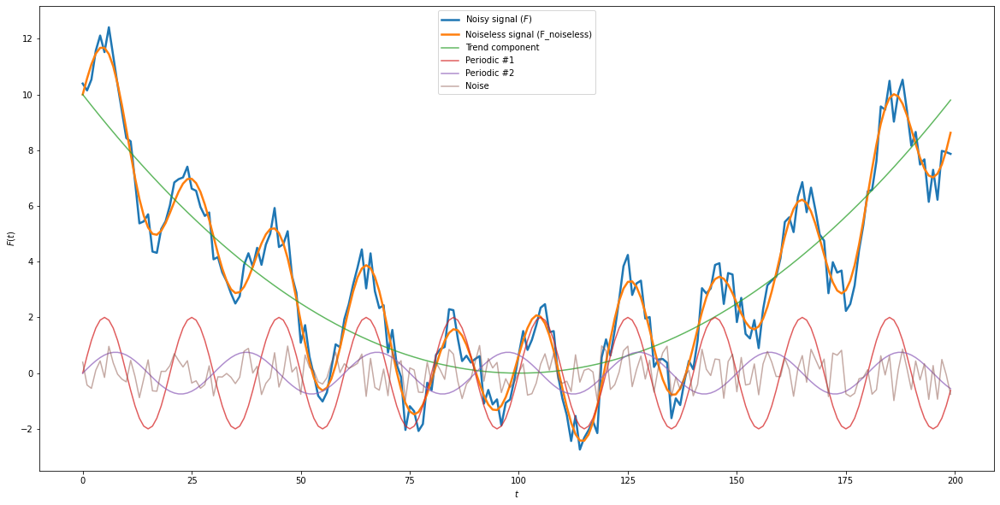

In [ ]:
N = 200
t = np.arange(0,N)
#3 components - 1 trend, 2 periodic
#trend
trend = 0.001 * (t - 100)**2

#periodic
p1, p2 = 20, 30 #periods
periodic1 = 2 * np.sin(2*pi*t/p1)
periodic2 = 0.75 * np.sin(2*pi*t/p2)
#Combined periodic
per = periodic1 + periodic2

#Generate noise
np.random.seed(123)
noise = 2 * (np.random.rand(N) - 0.5)
F_noiseless = trend + periodic1 + periodic2
F = F_noiseless + noise

#Plot
plt.figure(figsize=(20,10))
plt.plot(t, F, lw=2.5)
plt.plot(t, F_noiseless, lw =2.5)
plt.plot(t, trend, alpha=0.75)
plt.plot(t, periodic1, alpha=0.75)
plt.plot(t, periodic2, alpha=0.75)
plt.plot(t, noise, alpha=0.5)
plt.legend(["Noisy signal ($F$)", "Noiseless signal (F_noiseless)", "Trend component", "Periodic #1", "Periodic #2", "Noise"])
plt.xlabel("$t$")
plt.ylabel("$F(t)$")
plt.show()

ts = F

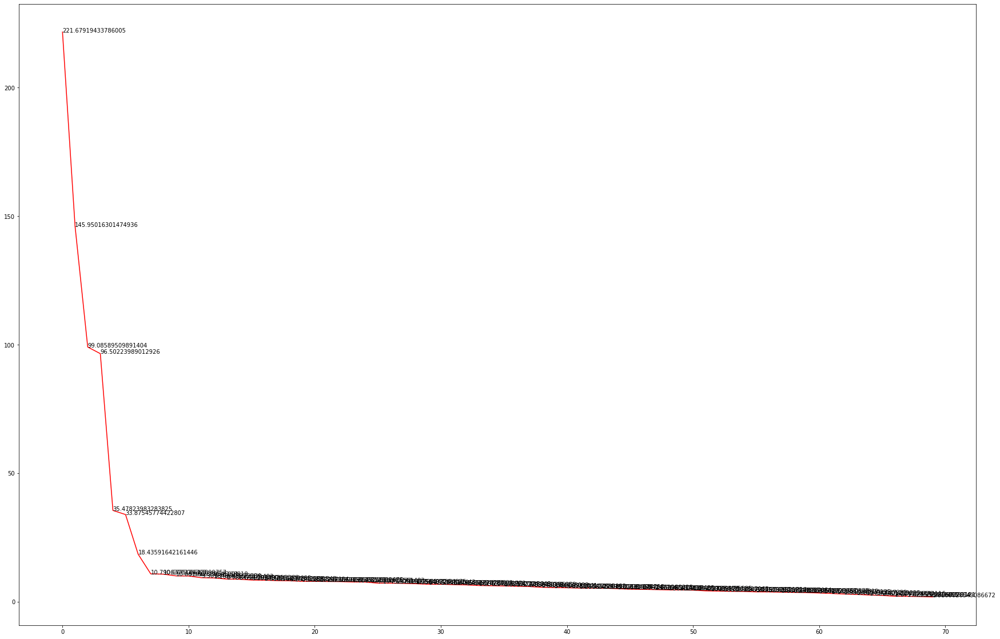

In [ ]:
X = build_traj_mat(ts, 70)
d, s, U, E, V = svd_(X) #SVD
X_elem = elem_matrices(X, d) #Elementary matrices
plot_contributions(s)

MSE: 0.023552562848239214
MSE: 0.07153660045998335


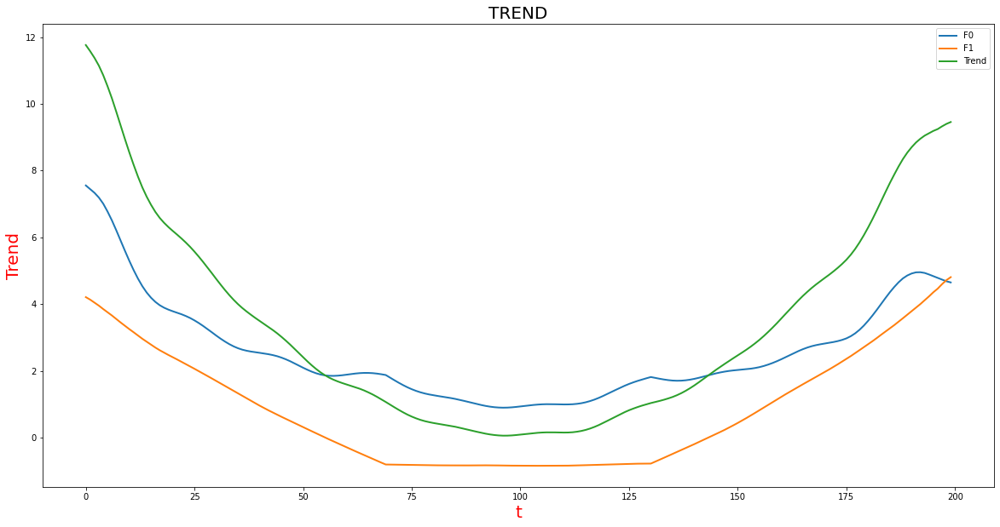

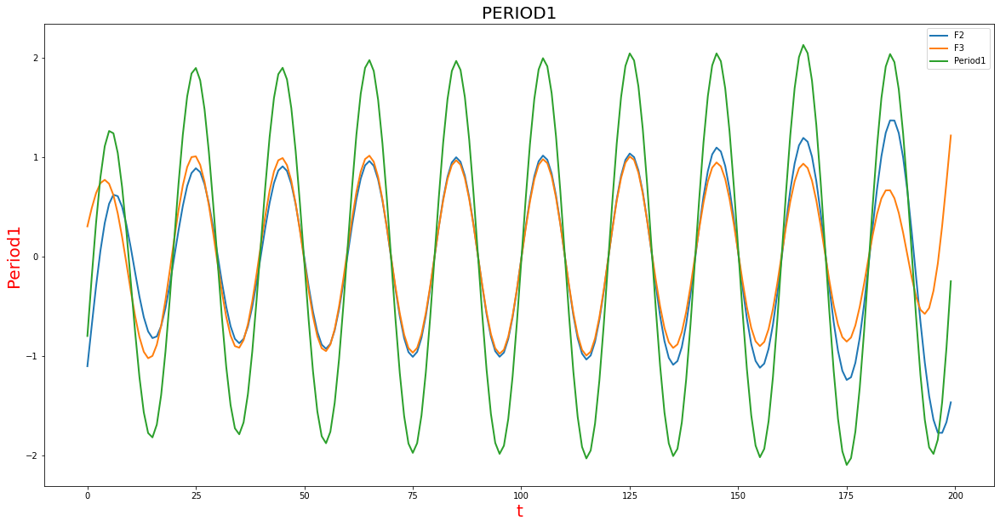

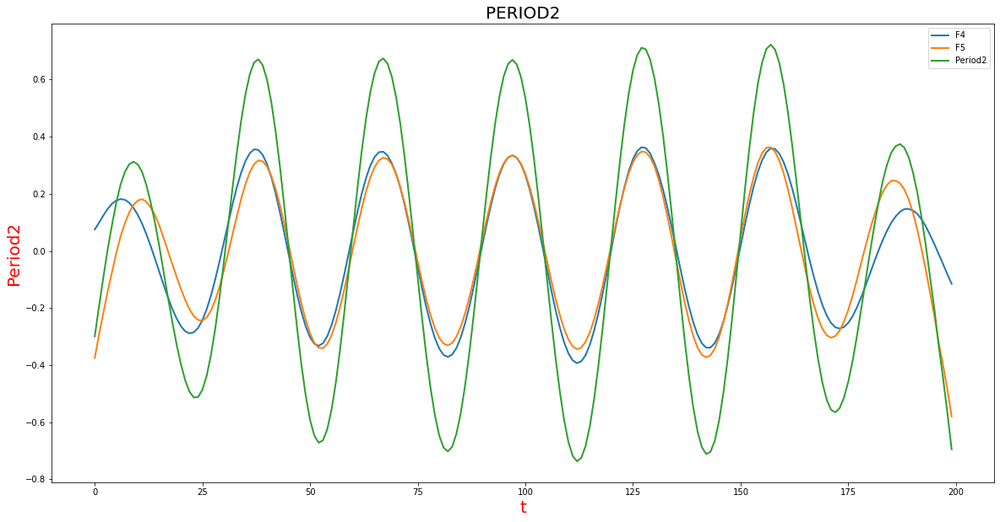

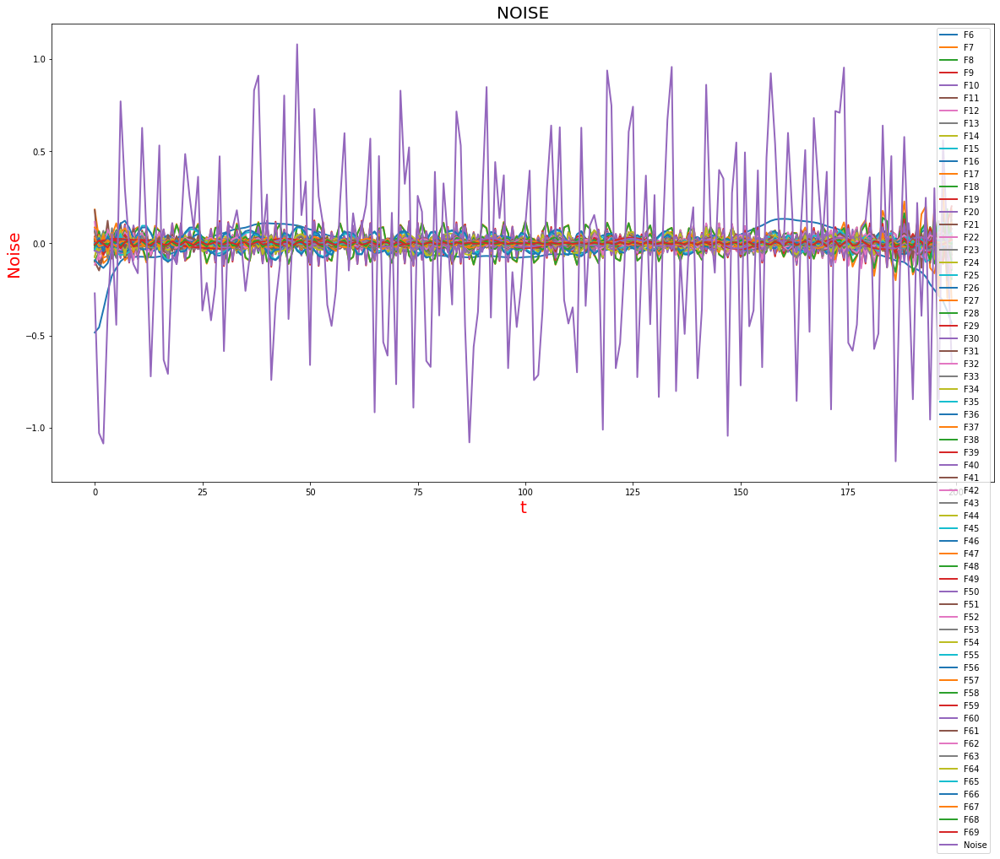

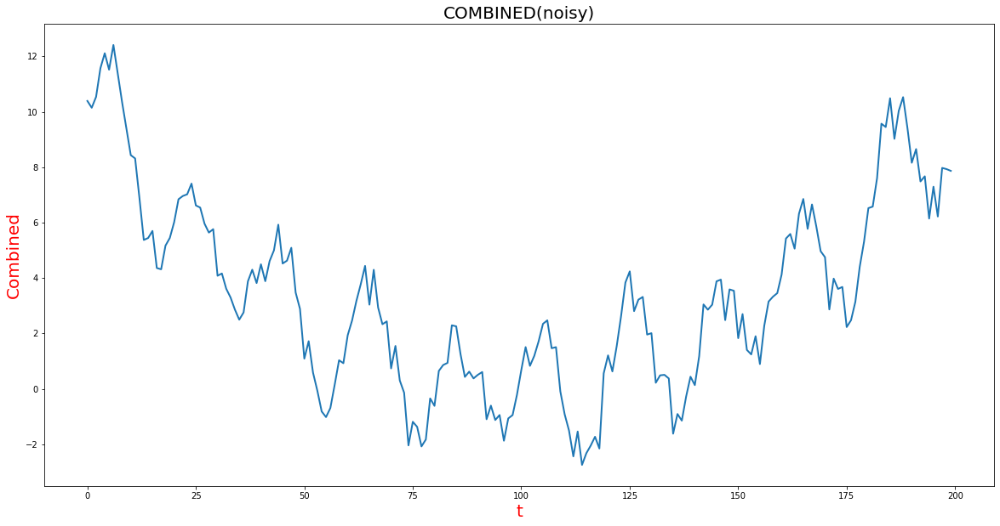

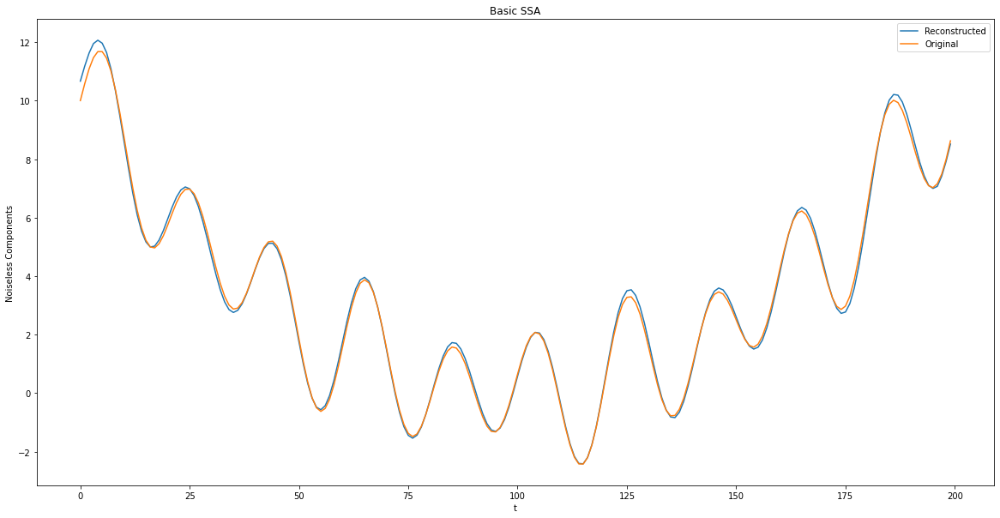

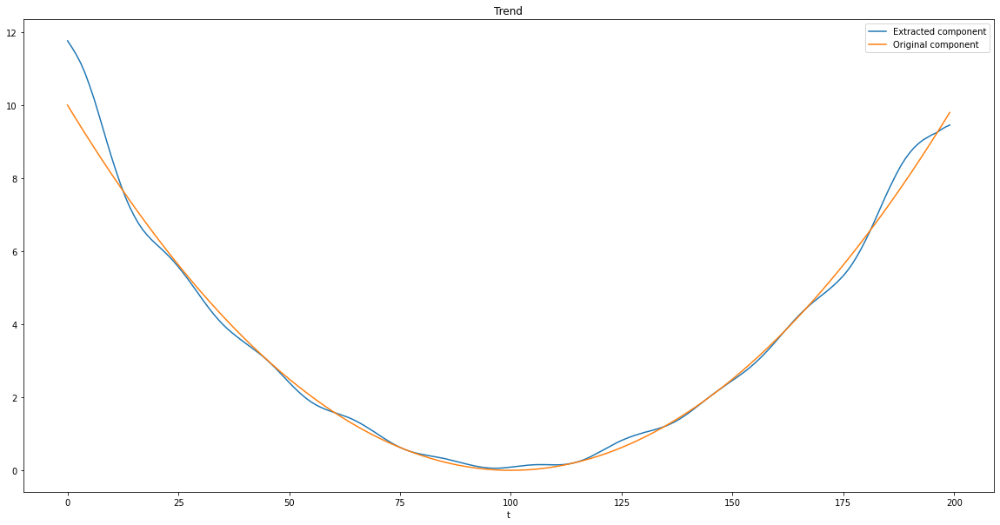

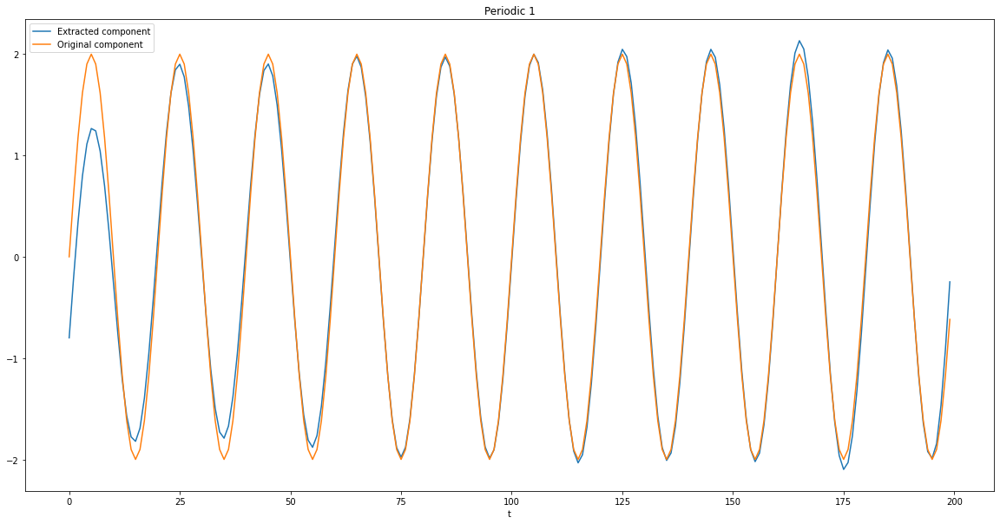

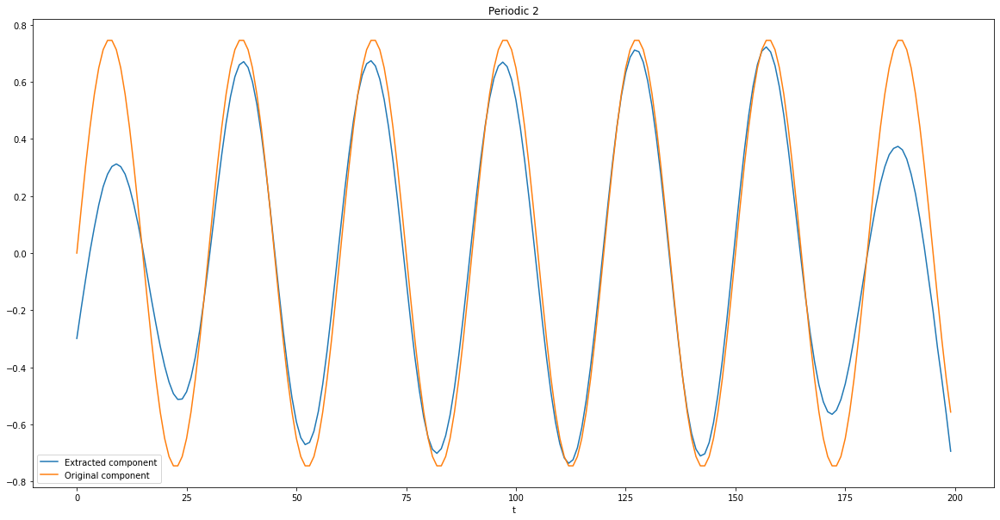

<Figure size 432x288 with 0 Axes>

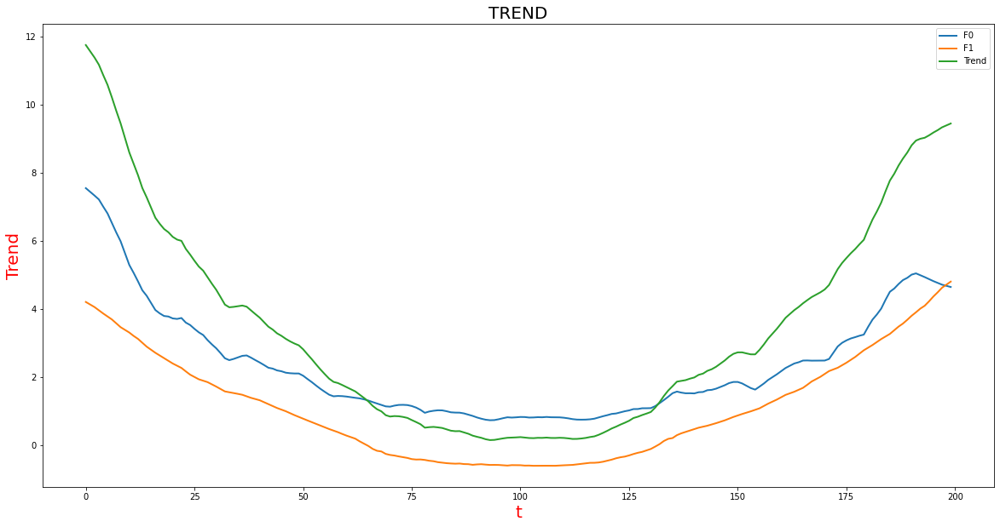

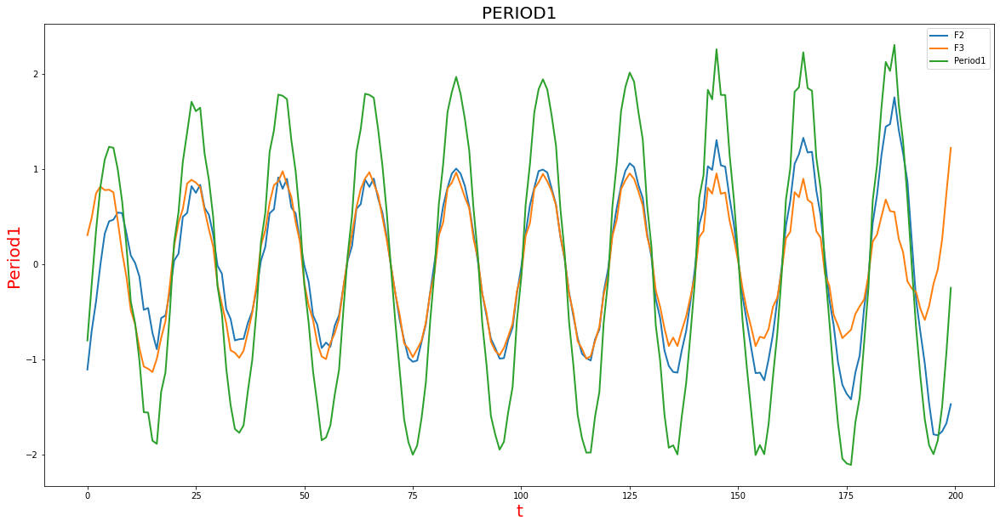

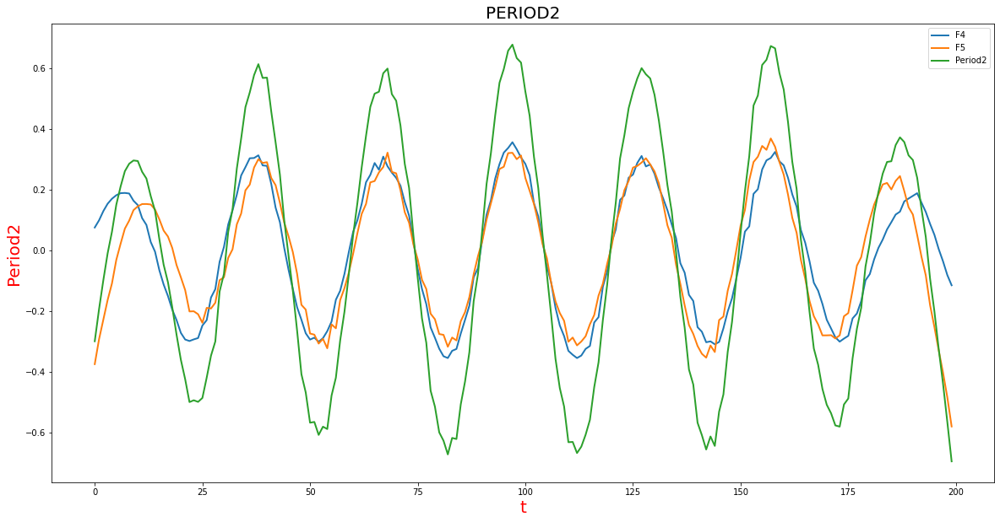

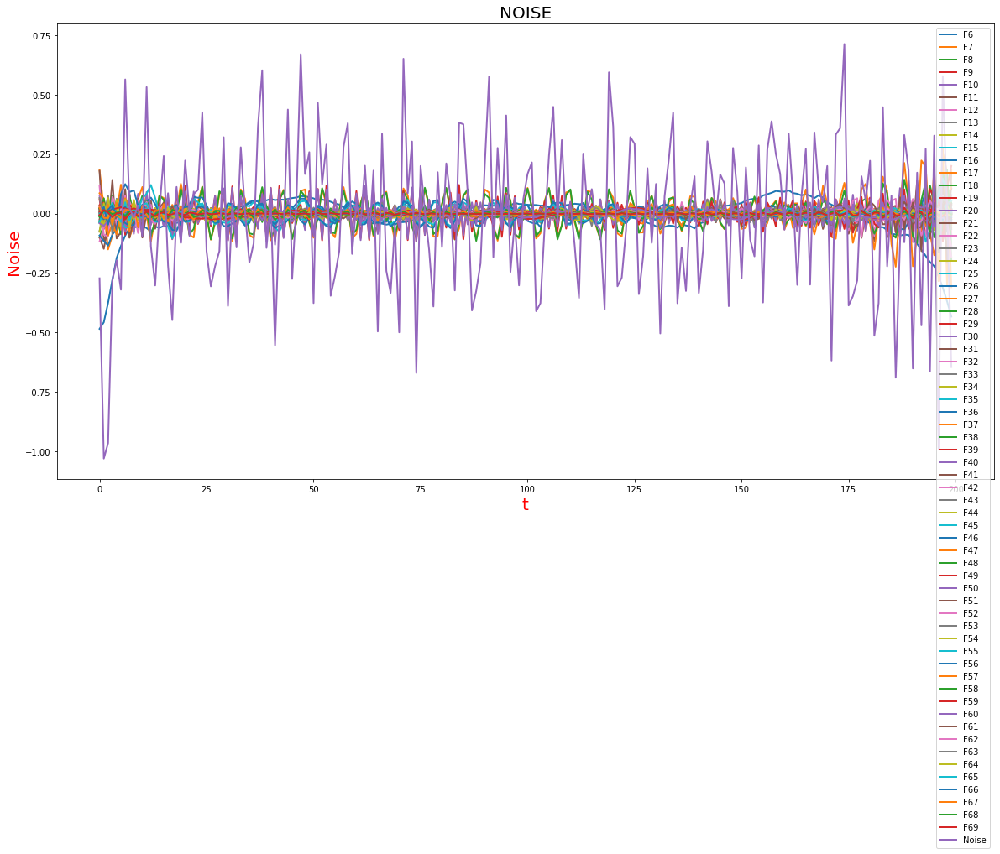

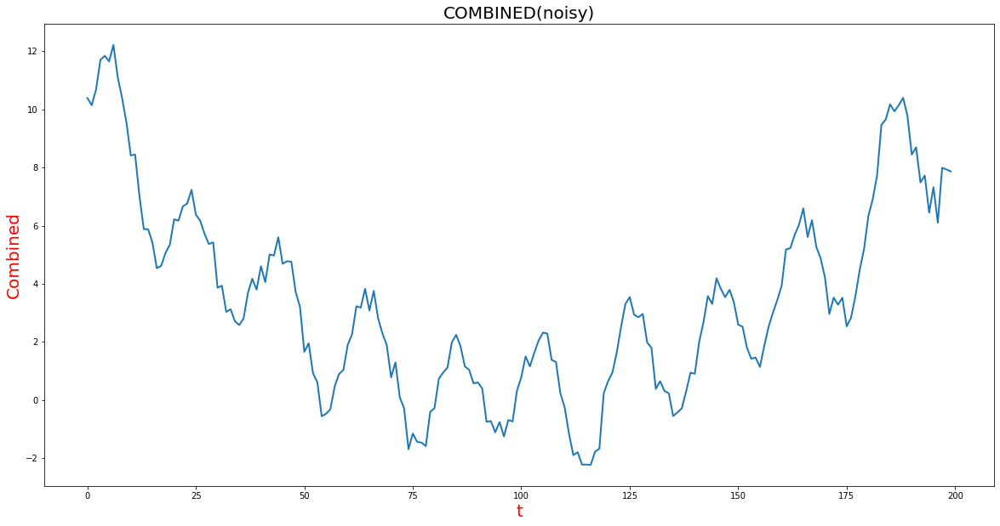

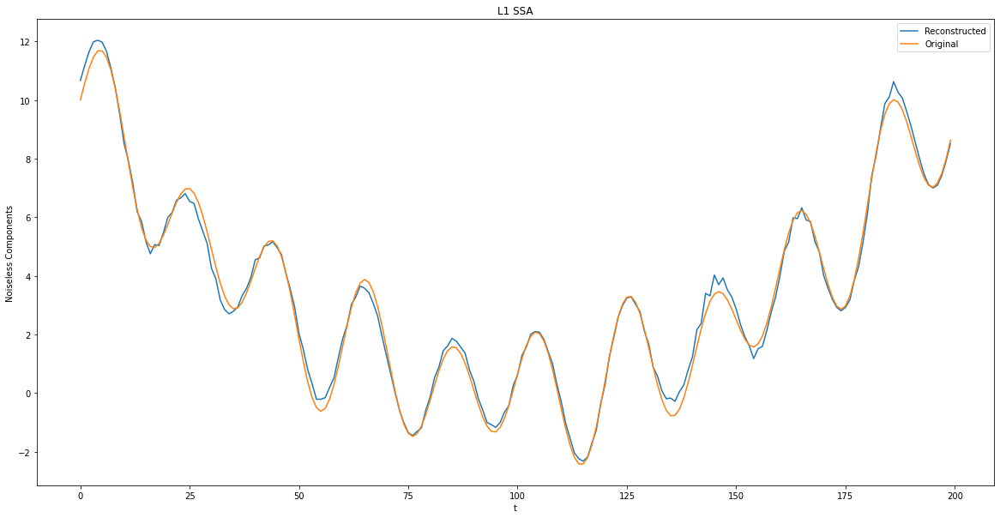

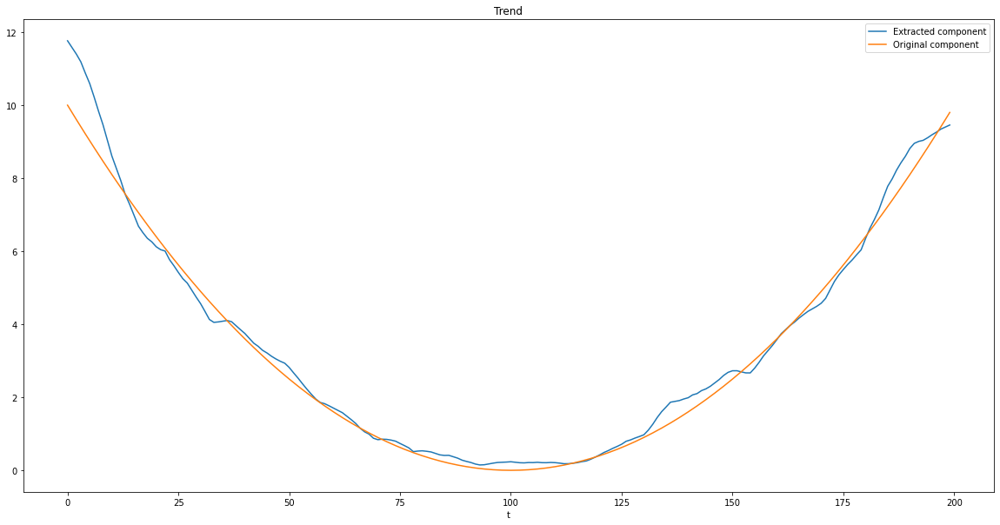

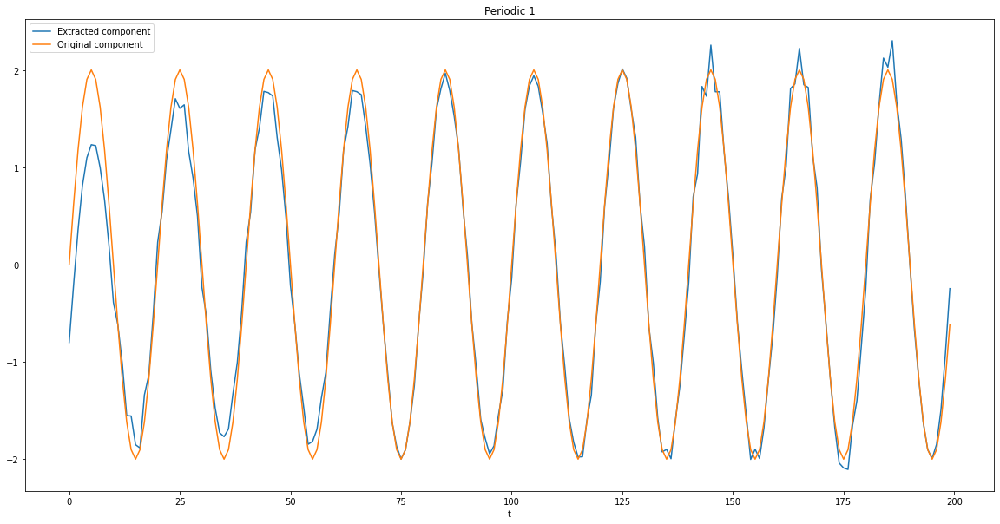

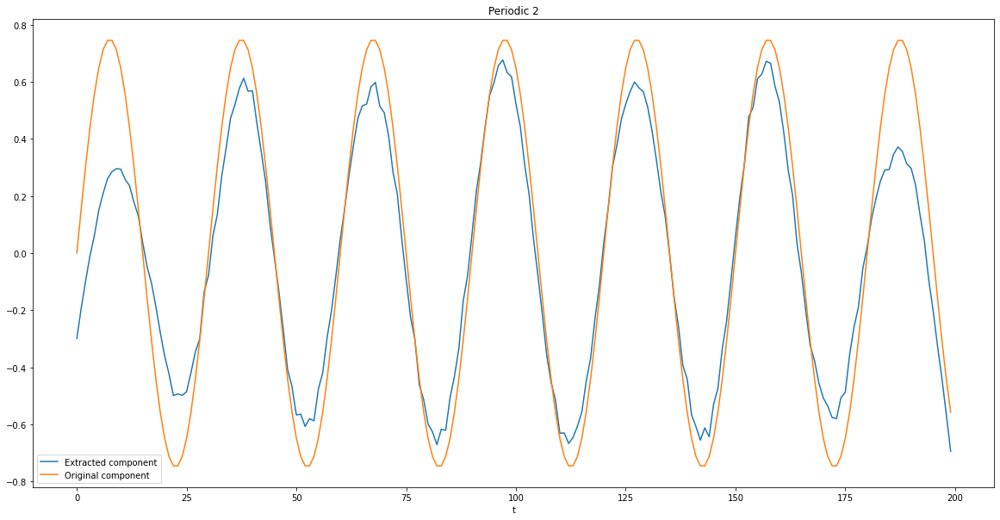

In [ ]:
'''
[0, 1] -> Trend
[2,3,4,5] -> Periodic
[6:] -> Noise
'''

[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, X_elem, False, ([0,1], "Trend"),
                                         ([2,3], "Period1"), ([4,5], "Period2"),
                                         (range(6,d), "Noise"))





combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("Basic SSA")
plt.legend()


#Performace
err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["Basic SSA Signal 1"] = err

#Performance Plot
plot_against_original((trend_comp, trend, "Trend"),
                      (per1, periodic1, "Periodic 1"),
                      (per2, periodic2, "Periodic 2"))


#################################################
#L1 Norm
plt.figure()
[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, X_elem, True, ([0,1], "Trend"),
                                         ([2,3], "Period1"), ([4,5], "Period2"),
                                         (range(6,d), "Noise"))

combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("L1 SSA")
plt.legend()

#Performance
err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["L1 Signal 1"] = err
#Performance Plot
plot_against_original((trend_comp, trend, "Trend"),
                      (per1, periodic1, "Periodic 1"),
                      (per2, periodic2, "Periodic 2"))

# Signal 2

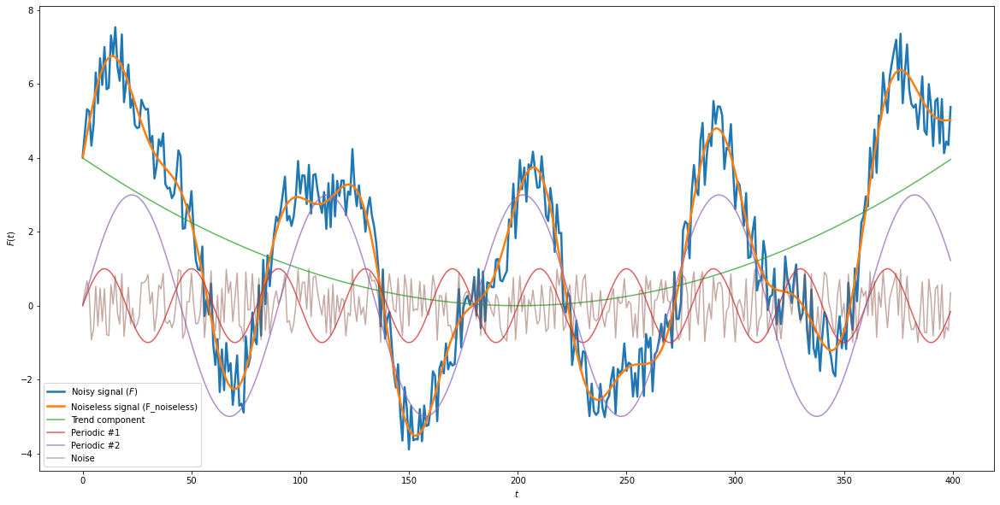

In [ ]:
N = 400
t = np.arange(0,N)
#3 components - 1 trend, 2 periodic
#trend
trend = 0.0001 * (t - 200)**2

#periodic
p1, p2 = 40, 90 #periods
periodic1 = 1 * np.sin(2*pi*t/p1)
periodic2 = 3 * np.sin(2*pi*t/p2)
#Combined periodic
per = periodic1 + periodic2

#Generate noise
np.random.seed(222)
noise = 2 * (np.random.rand(N) - 0.5)
F_noiseless = trend + periodic1 + periodic2
F = F_noiseless + noise

#Plot
plt.figure(figsize=(20,10))
plt.plot(t, F, lw=2.5)
plt.plot(t, F_noiseless, lw =2.5)
plt.plot(t, trend, alpha=0.75)
plt.plot(t, periodic1, alpha=0.75)
plt.plot(t, periodic2, alpha=0.75)
plt.plot(t, noise, alpha=0.5)
plt.legend(["Noisy signal ($F$)", "Noiseless signal (F_noiseless)", "Trend component", "Periodic #1", "Periodic #2", "Noise"])
plt.xlabel("$t$")
plt.ylabel("$F(t)$")
plt.show()

ts = F

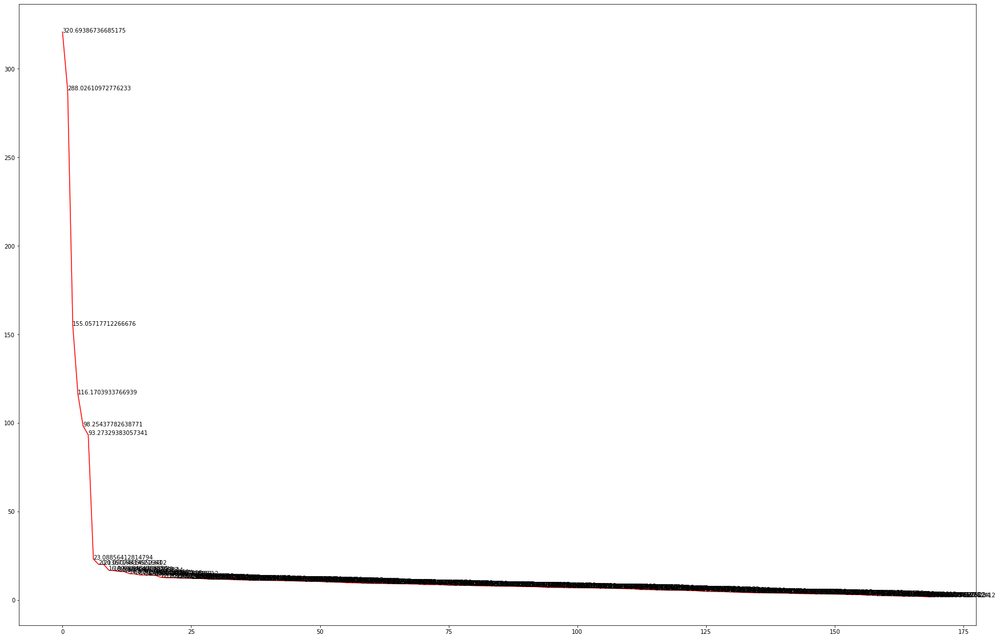

In [ ]:
X = build_traj_mat(ts, 170)
d, s, U, E, V = svd_(X) #SVD
X_elem = elem_matrices(X, d) #Elementary matrices
plot_contributions(s)

MSE: 0.00920106899371487
MSE: 0.06919589452441616


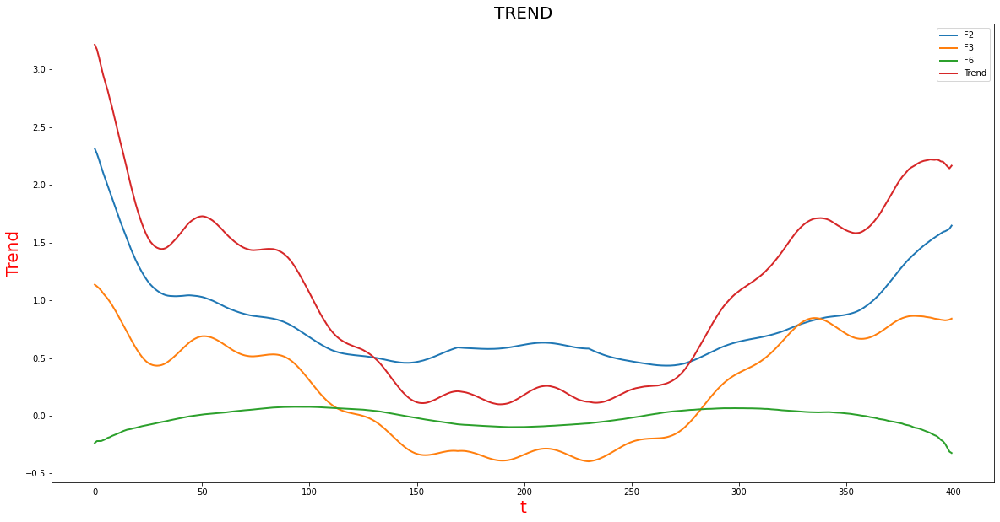

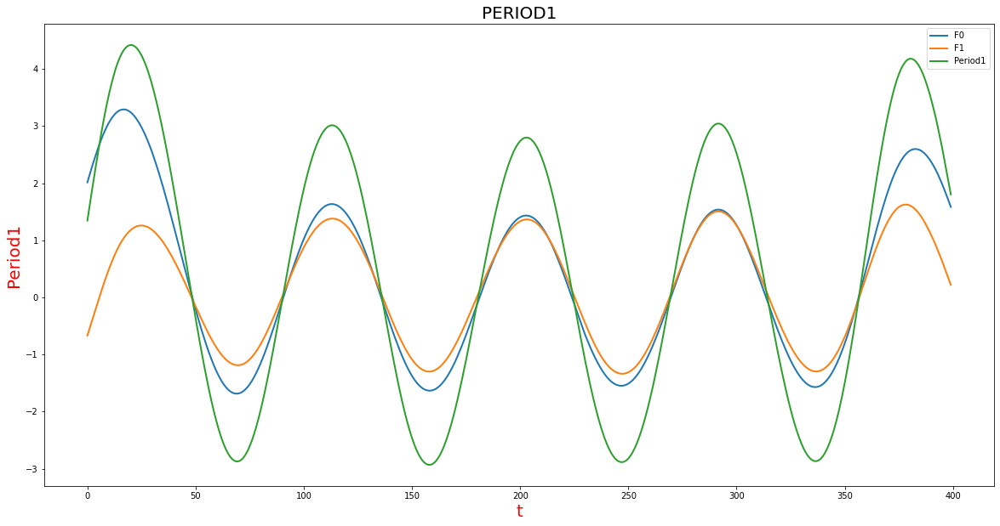

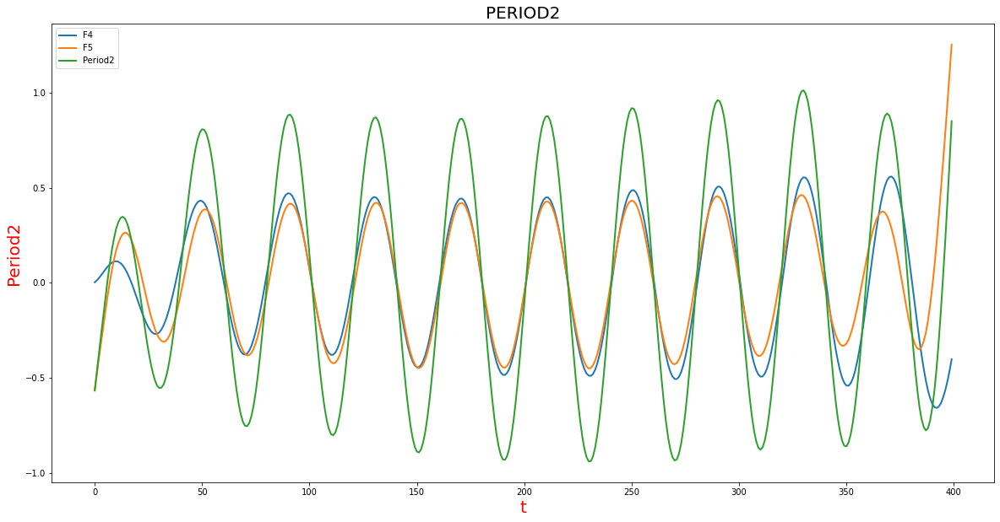

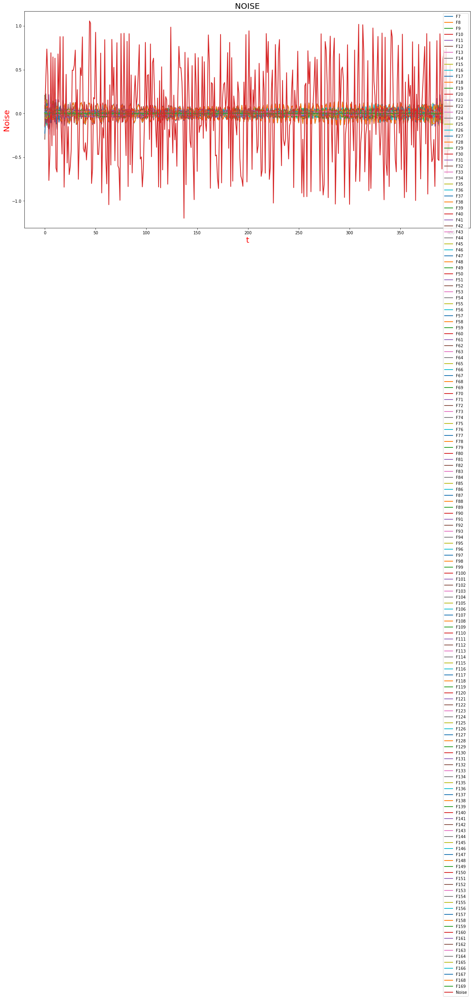

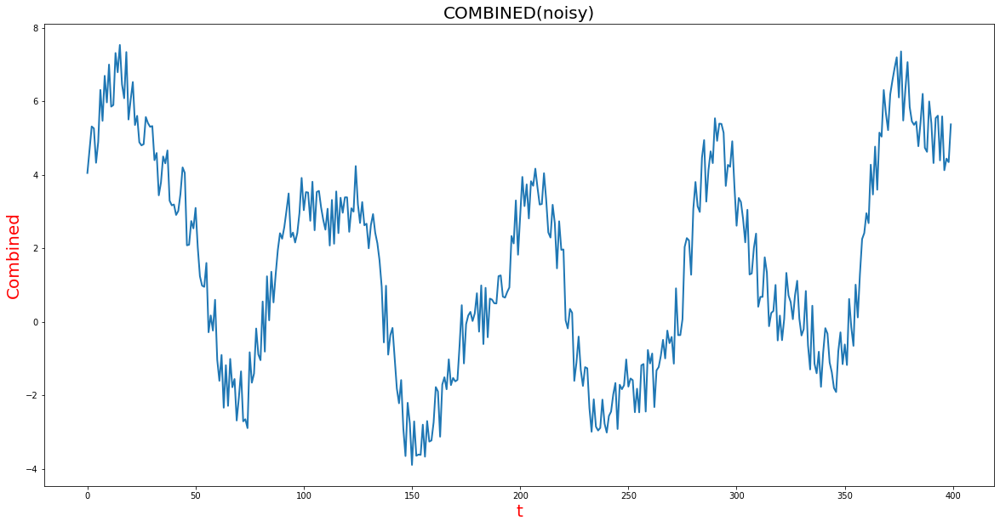

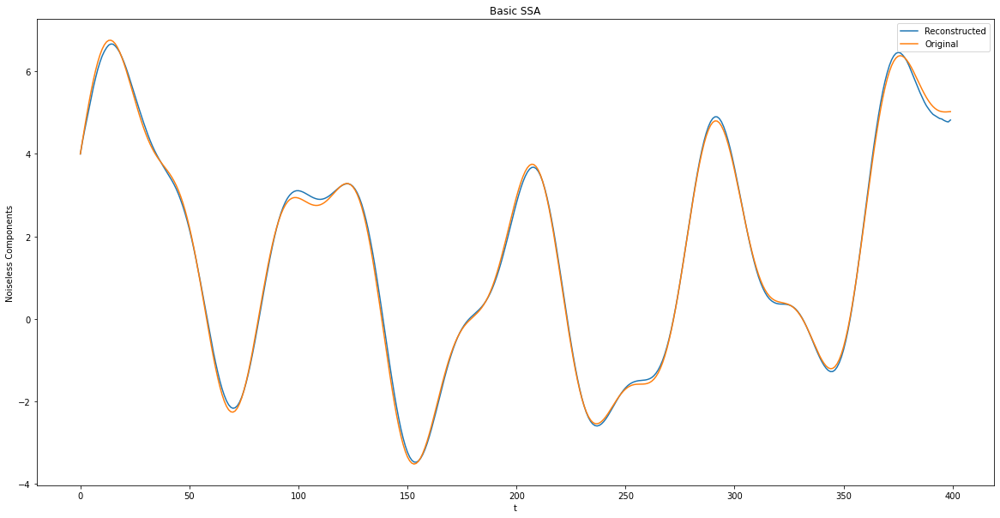

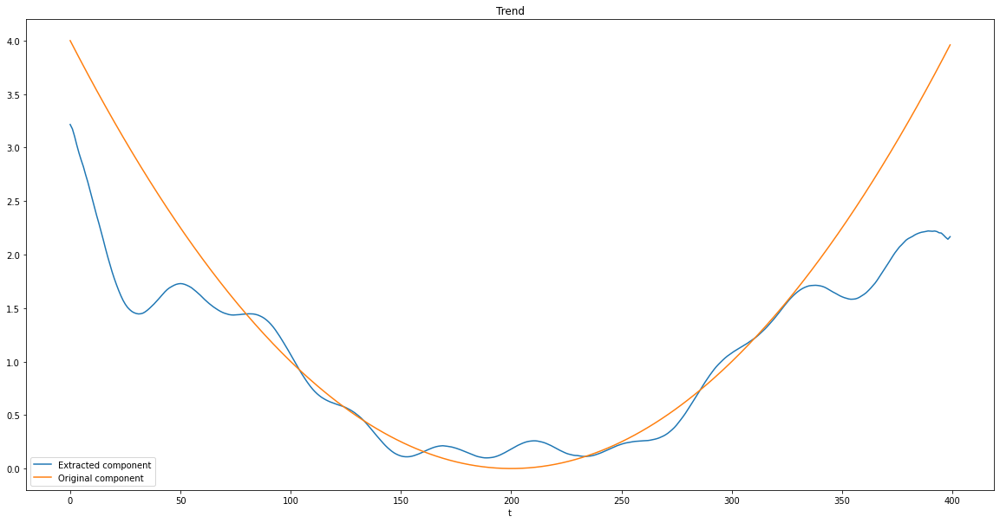

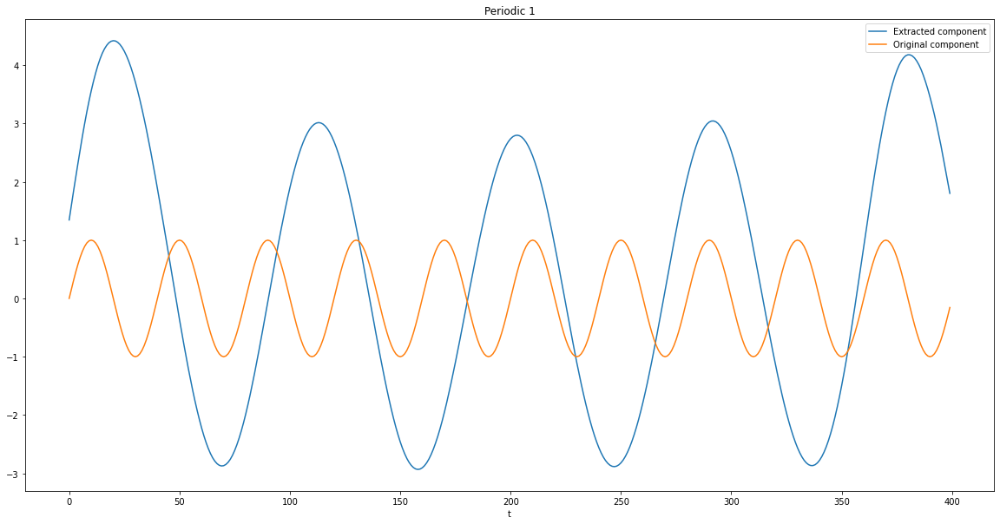

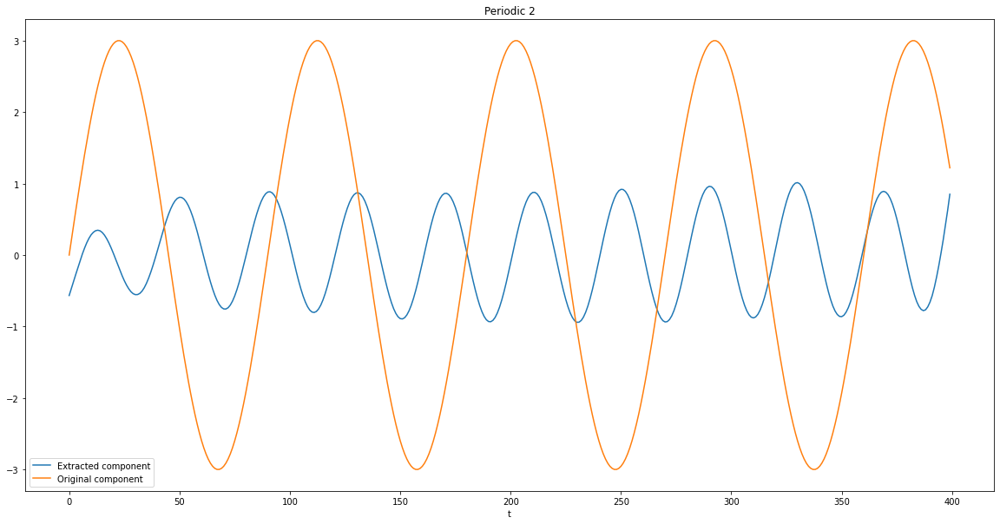

<Figure size 432x288 with 0 Axes>

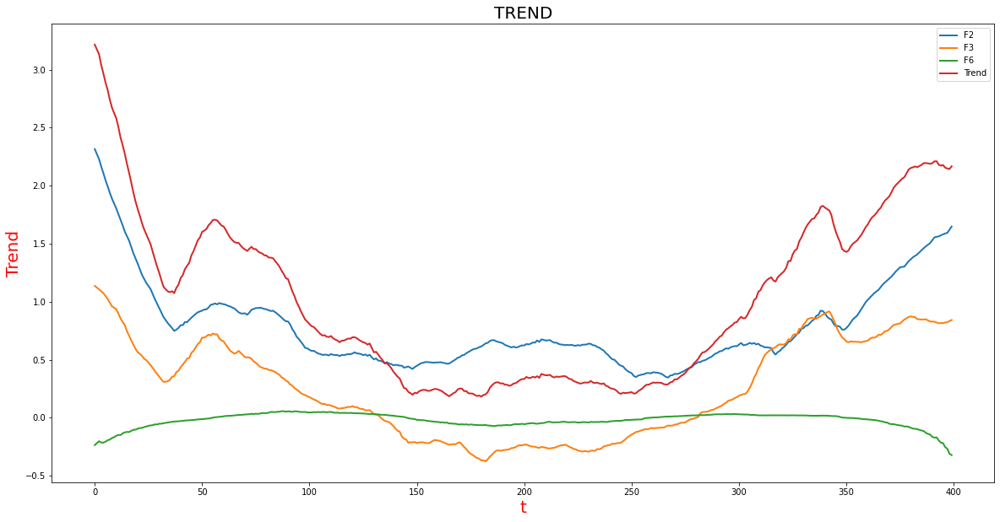

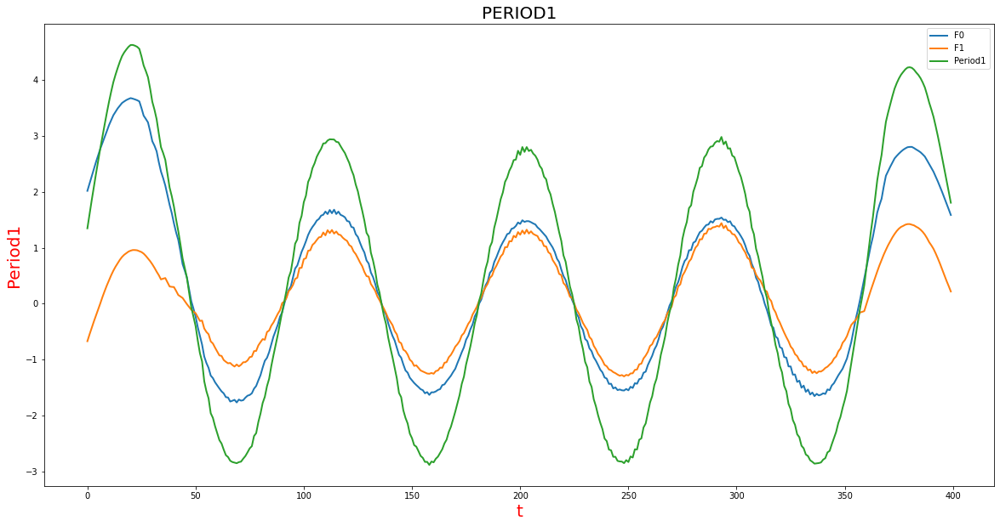

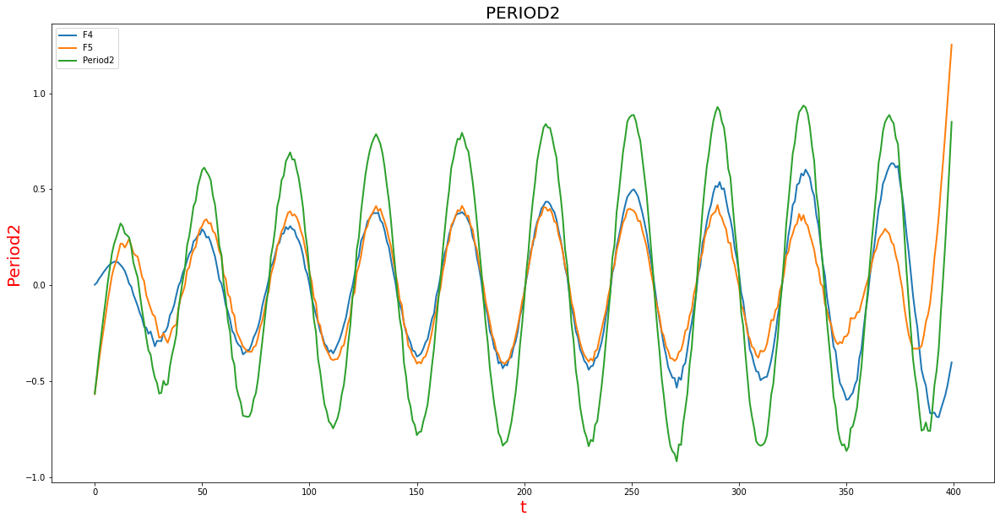

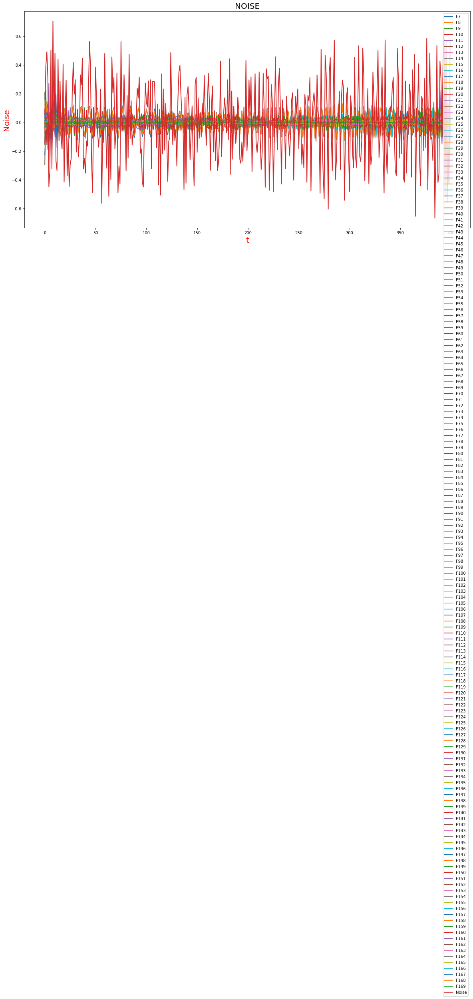

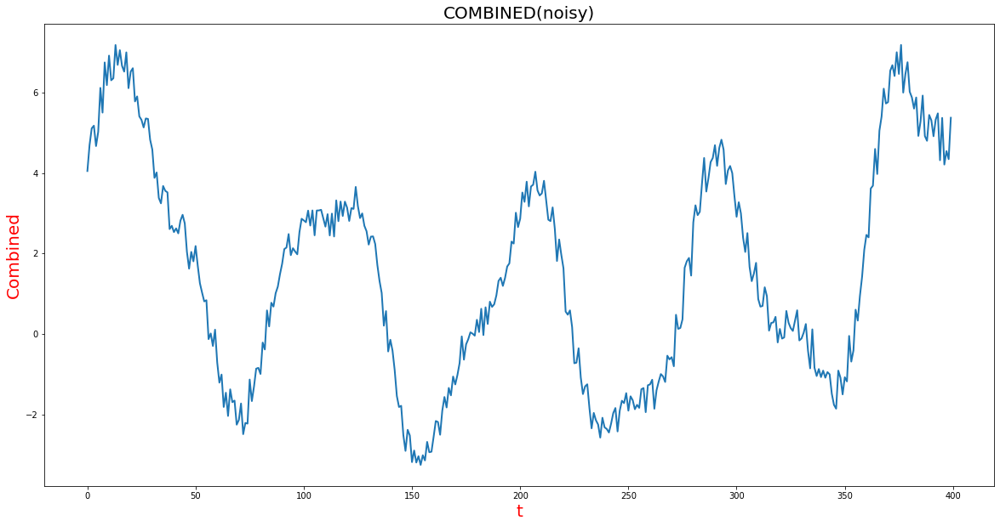

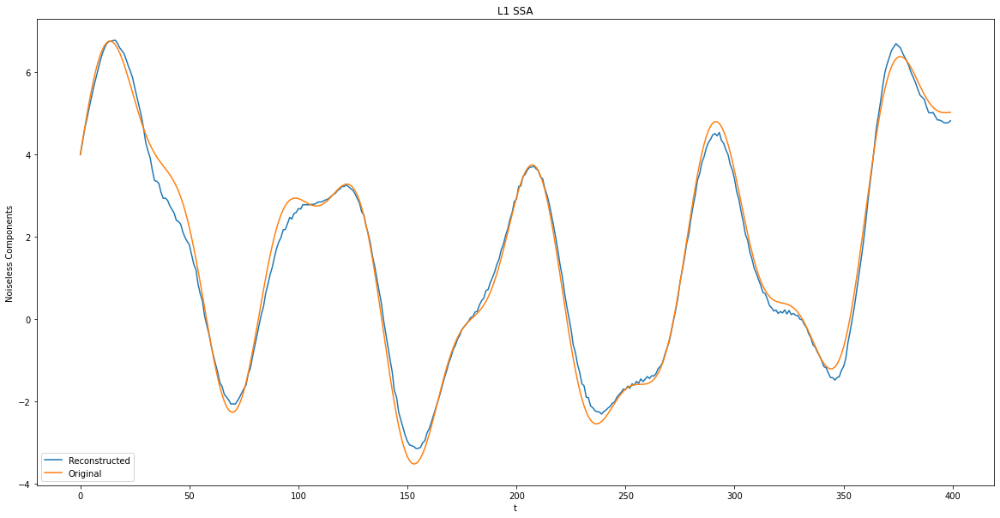

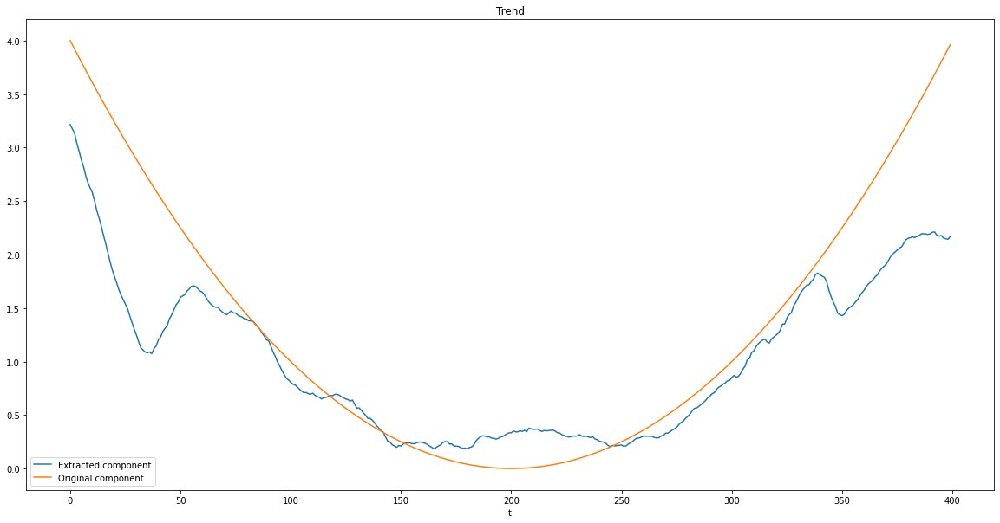

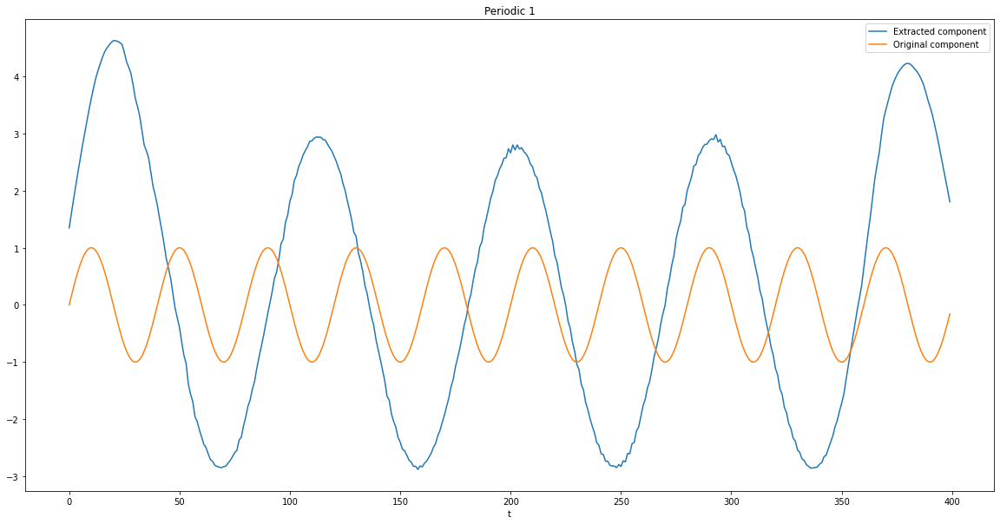

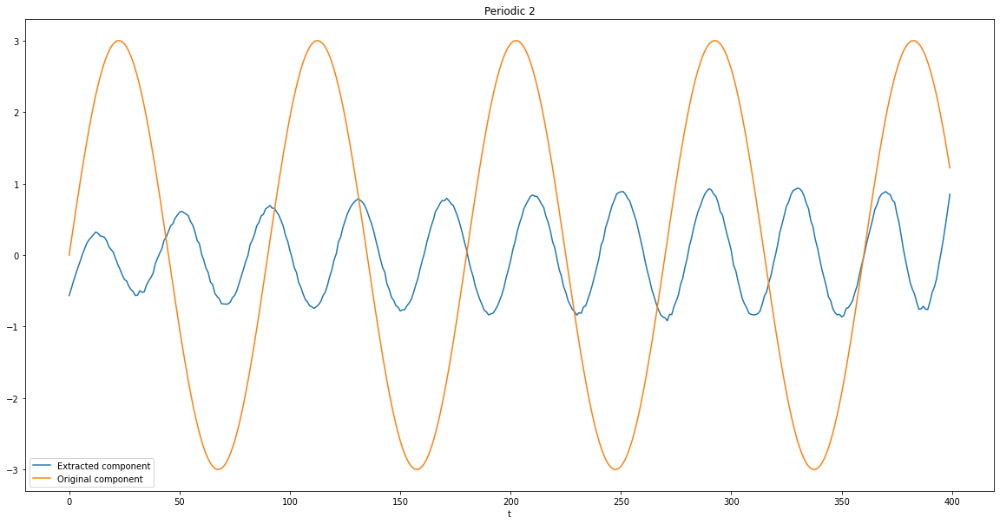

In [ ]:
'''
[0, 1] -> Periodic1
[4,5] -> Periodic2
[2, 3, 6] -> Trend
[6:] -> Noise
'''

[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, X_elem, False, ([2,3,6], "Trend"),
                                         ([0,1], "Period1"), ([4,5], "Period2"),
                                         (range(7,d), "Noise"))

combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("Basic SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["Basic SSA Signal 2"] = err

plot_against_original((trend_comp, trend, "Trend"), (per1, periodic1, "Periodic 1"),
                      (per2, periodic2, "Periodic 2"))

#L1 Norm
plt.figure()
[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, X_elem, True, ([2,3,6], "Trend"),
                                         ([0,1], "Period1"), ([4,5], "Period2"),
                                         (range(7,d), "Noise"))
combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("L1 SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["L1 Signal 2"] = err

plot_against_original((trend_comp, trend, "Trend"), (per1, periodic1, "Periodic 1"),
                      (per2, periodic2, "Periodic 2"))


# AutoSSA


In [ ]:
def build_traj(ts,L):
    '''
    Builds a trajectory matrix out of the time series
    '''
    N = len(ts)
    #L = Window Length
    K = N-L+1 #Number of columns in the trajectory matrix
    print(f'Realization length(N):\t{N}\nWindow Length(L):\t{L}\nK:\t\t\t{K}')
    X = np.column_stack([ts[i:i+L] for i in range(K)])
    print(f"Trajectory Matrix:\n{X}")
    return X

def SVD(X):
    '''
    Helper function to perfrom singular value decomposition of a matrix
    d = rank
    '''
    d = np.linalg.matrix_rank(X)
    U,s,vh = np.linalg.svd(X)
    E = np.diag(s)
    V = np.transpose(vh)
    return d, U, s, vh, E, V

def X_to_TS(X, L1 = False):
    '''
    Helper function to perform diagonal averaging over the anti diagonals of a
    given matrix
    If L1 is True, returns the diagonal median over the antidiagonals (used in
    L1 SSA)
    '''
    X_rev = np.fliplr(X)
    m,n = np.shape(X)
    if L1:
        x = np.array([np.median(X_rev.diagonal(i)) for i in range(-m+1, n)])
    else:
        x = np.array([X_rev.diagonal(i).mean() for i in range(-m+1, n)])
    return x[::-1]

def autoSSA(ts,r,L, L1 = False):
    '''
    s = data
    r = number of components to extract
    L = embedding dimension
    L1 = True => L1-autoSSA
    '''
    #Trajectory Matrix
    X = build_traj(ts, L)
    #SVD
    d, U, s, vh, E, V = SVD(X)
    X_elem = np.array( [s[i] * np.outer(U[:,i], V[:,i]) for i in range(0,d)] )
    xts = []
    for i in range(L):
        xts.append(X_to_TS(X_elem[i], L1))
    xts = np.array(xts)
    #HCA
    dendrogram = sch.dendrogram(sch.linkage(xts, method='ward'))
    model = ac(n_clusters = 5, affinity = 'euclidean', linkage = 'ward')
    model.fit(xts)
    labels = model.labels_
    #separate elements
    f = []
    for i in range(r):
        f.append(xts[labels == i])
    x = []
    for i in range(r):
        x_ = 0
        for i in f[i]:
           x_ += i
        x.append(x_)
    plt.figure(figsize=(20,10))
    styles = ['r', 'b', 'g', 'y', 'r+']
    for i in range(r):
        plt.plot(x[i], styles[i], label = f'x{i}')
        plt.legend()
    plt.show()

    return x

def plot_components(N, x, *args):
    '''
    N = length of time series
    ([indices], comp_name)
    '''
    comps = []
    for (comp_list, comp_name) in args:
        comp = np.zeros(N)
        plt.figure(figsize = (20,10))
        for i in comp_list:
            comp += x[i]
        plt.plot(comp, lw=2, label = comp_name)
        plt.xlabel("t", fontsize=20)
        plt.ylabel(comp_name, fontsize=20)
        comps.append(comp)
        plt.legend()

    combined = np.zeros(N)
    for comp in comps:
        combined += comp

    plt.figure(figsize=(20,10))
    plt.plot(combined, lw=2, label="Combined")
    plt.legend()

    comps.append(combined)

    return comps

# Signal 1

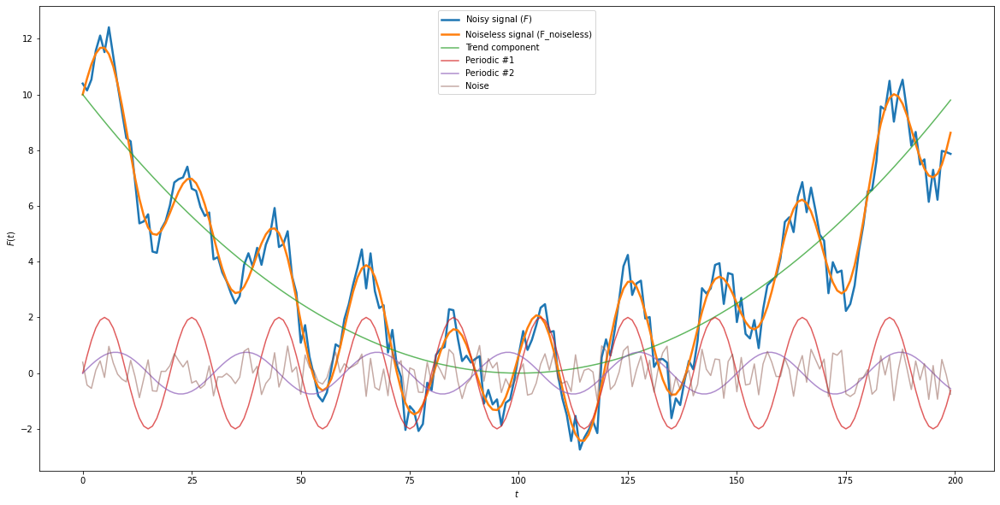

In [ ]:
N = 200
t = np.arange(0,N)
#3 components - 1 trend, 2 periodic
#trend
trend = 0.001 * (t - 100)**2

#periodic
p1, p2 = 20, 30 #periods
periodic1 = 2 * np.sin(2*pi*t/p1)
periodic2 = 0.75 * np.sin(2*pi*t/p2)
#Combined periodic
per = periodic1 + periodic2

#Generate noise
np.random.seed(123)
noise = 2 * (np.random.rand(N) - 0.5)
F_noiseless = trend + periodic1 + periodic2
F = F_noiseless + noise

#Plot
plt.figure(figsize=(20,10))
plt.plot(t, F, lw=2.5)
plt.plot(t, F_noiseless, lw =2.5)
plt.plot(t, trend, alpha=0.75)
plt.plot(t, periodic1, alpha=0.75)
plt.plot(t, periodic2, alpha=0.75)
plt.plot(t, noise, alpha=0.5)
plt.legend(["Noisy signal ($F$)", "Noiseless signal (F_noiseless)", "Trend component", "Periodic #1", "Periodic #2", "Noise"])
plt.xlabel("$t$")
plt.ylabel("$F(t)$")
plt.show()

ts = F

Realization length(N):	200
Window Length(L):	70
K:			131
Trajectory Matrix:
[[10.39293837 10.14724643 10.53832589 ...  3.31939929  1.96106648
   2.01166512]
 [10.14724643 10.53832589 11.57050247 ...  1.96106648  2.01166512
   0.22246266]
 [10.53832589 11.57050247 12.11440959 ...  2.01166512  0.22246266
   0.49066557]
 ...
 [ 2.94025816  2.33390785  2.43724029 ...  7.29680072  6.22234907
   7.97547484]
 [ 2.33390785  2.43724029  0.74094409 ...  6.22234907  7.97547484
   7.93341656]
 [ 2.43724029  0.74094409  1.55097828 ...  7.97547484  7.93341656
   7.8691161 ]]


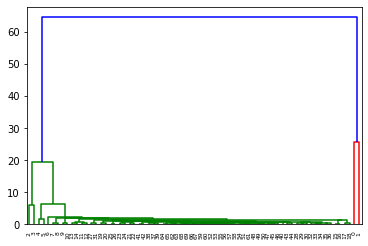

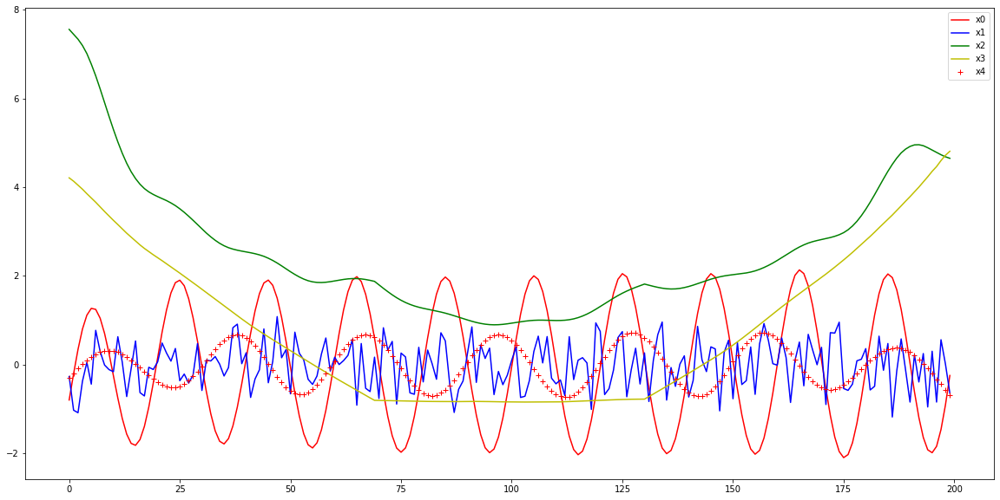

MSE: 0.023552562848239214
Realization length(N):	200
Window Length(L):	70
K:			131
Trajectory Matrix:
[[10.39293837 10.14724643 10.53832589 ...  3.31939929  1.96106648
   2.01166512]
 [10.14724643 10.53832589 11.57050247 ...  1.96106648  2.01166512
   0.22246266]
 [10.53832589 11.57050247 12.11440959 ...  2.01166512  0.22246266
   0.49066557]
 ...
 [ 2.94025816  2.33390785  2.43724029 ...  7.29680072  6.22234907
   7.97547484]
 [ 2.33390785  2.43724029  0.74094409 ...  6.22234907  7.97547484
   7.93341656]
 [ 2.43724029  0.74094409  1.55097828 ...  7.97547484  7.93341656
   7.8691161 ]]


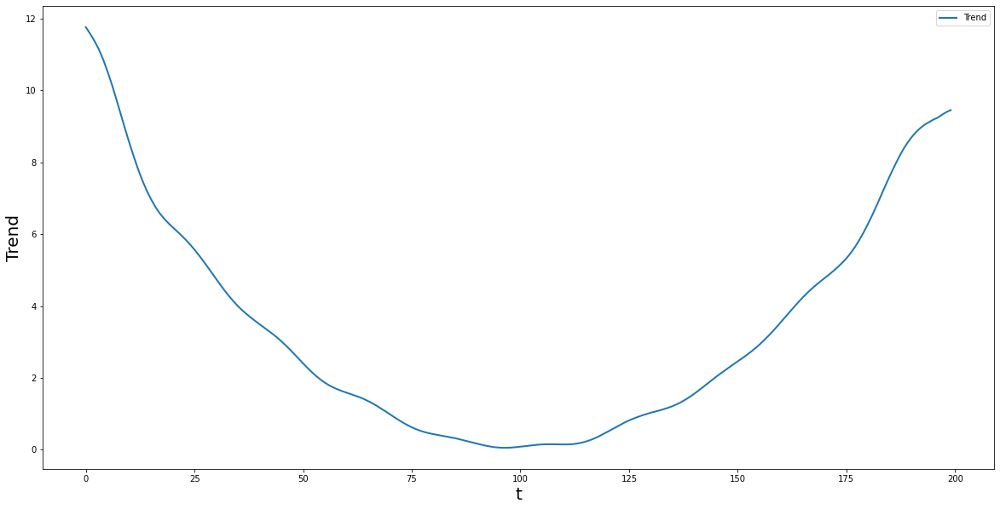

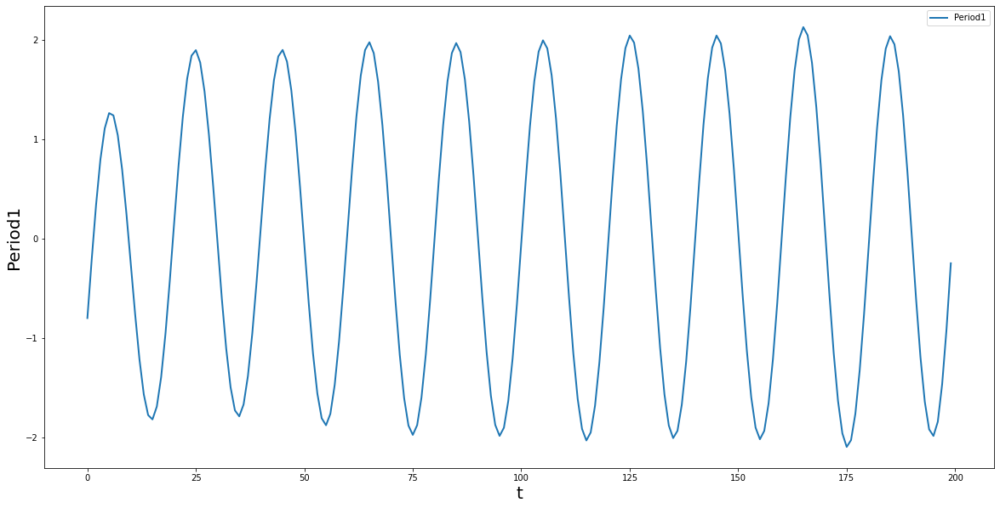

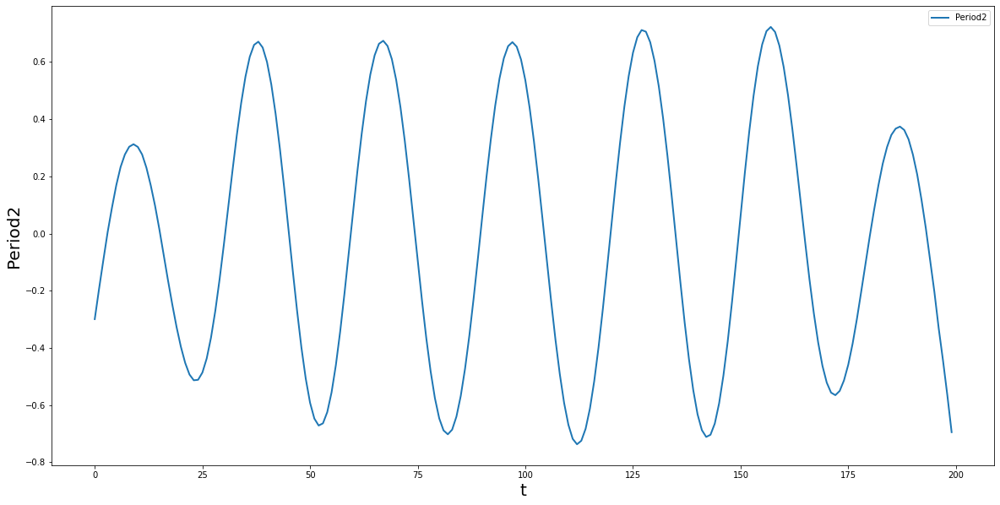

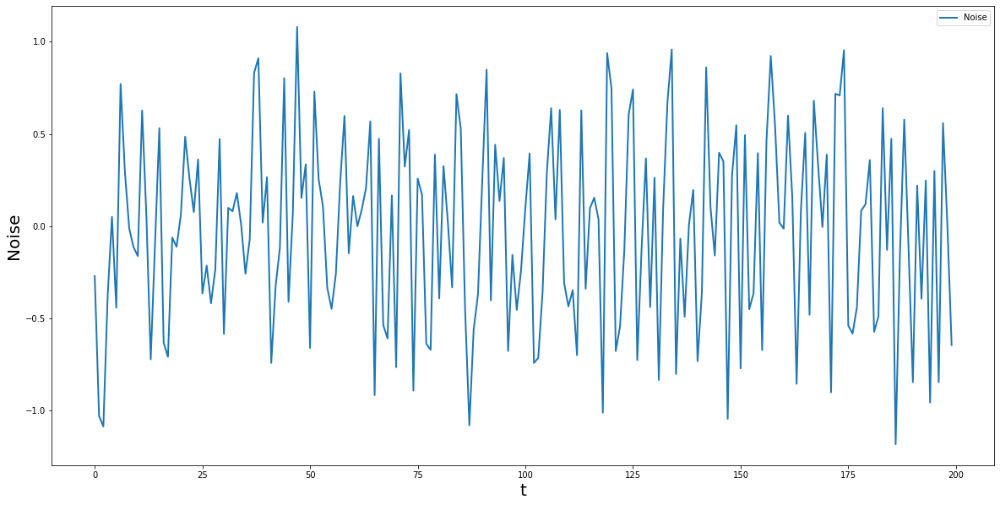

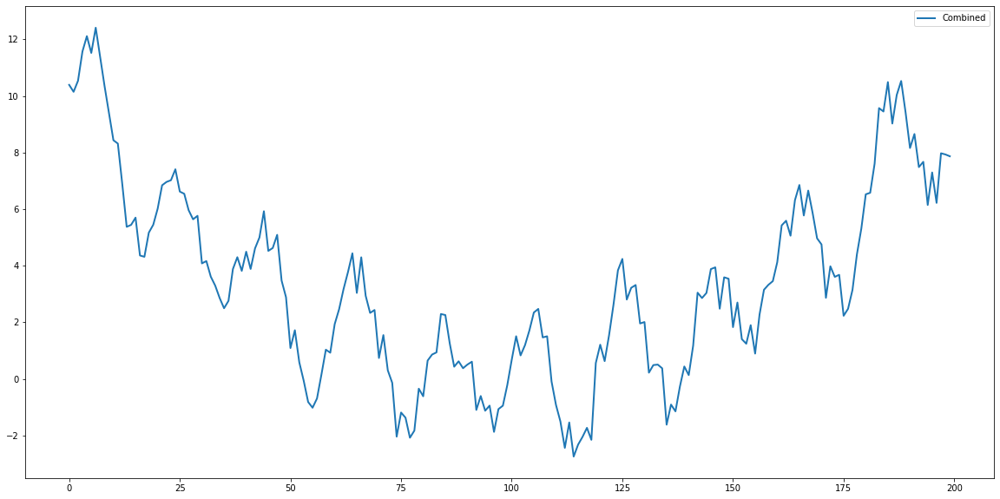

...

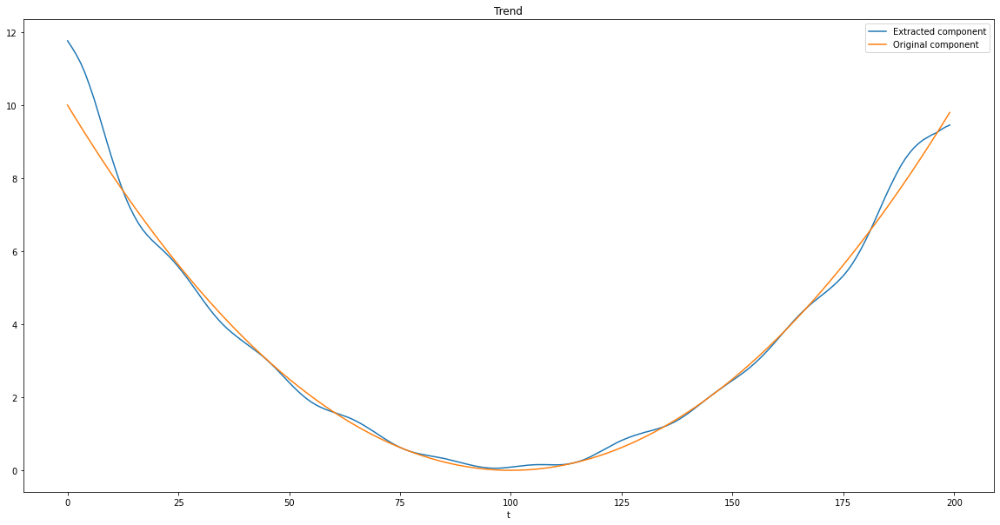

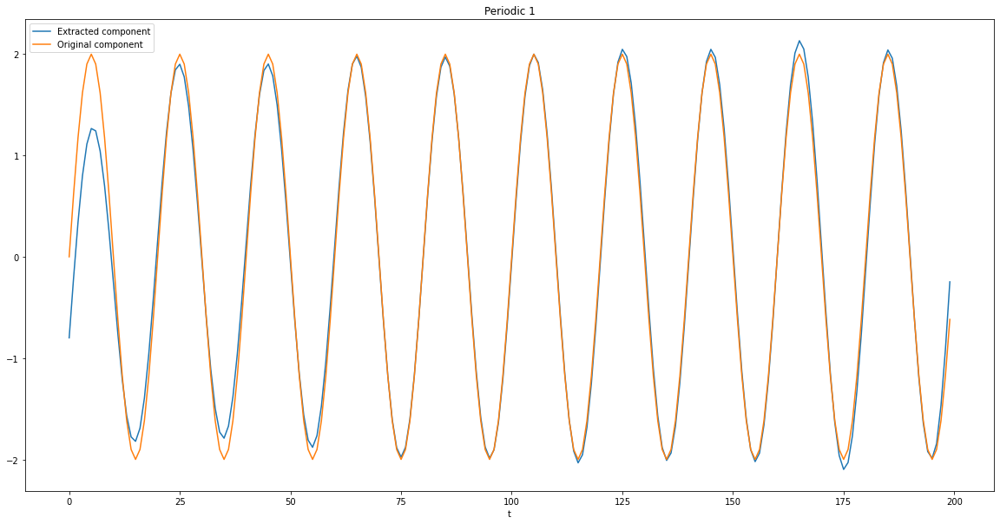

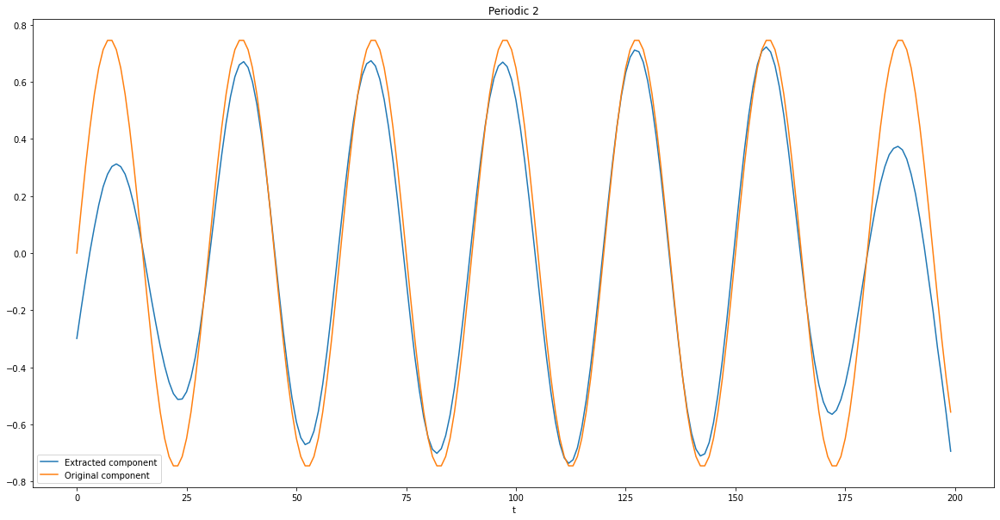

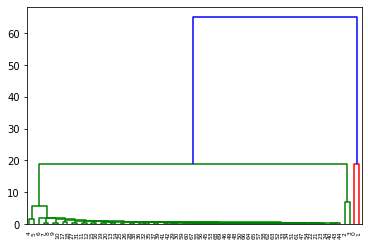

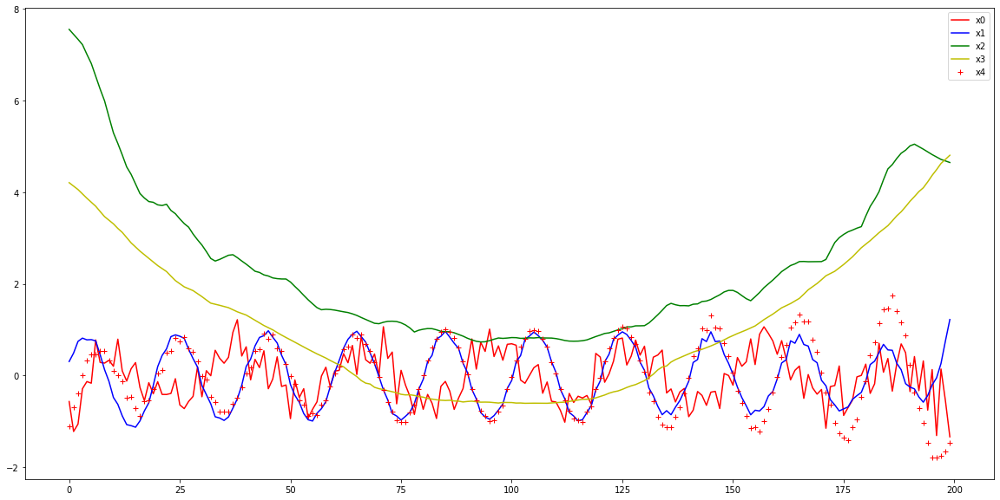

MSE: 0.29301833081713263


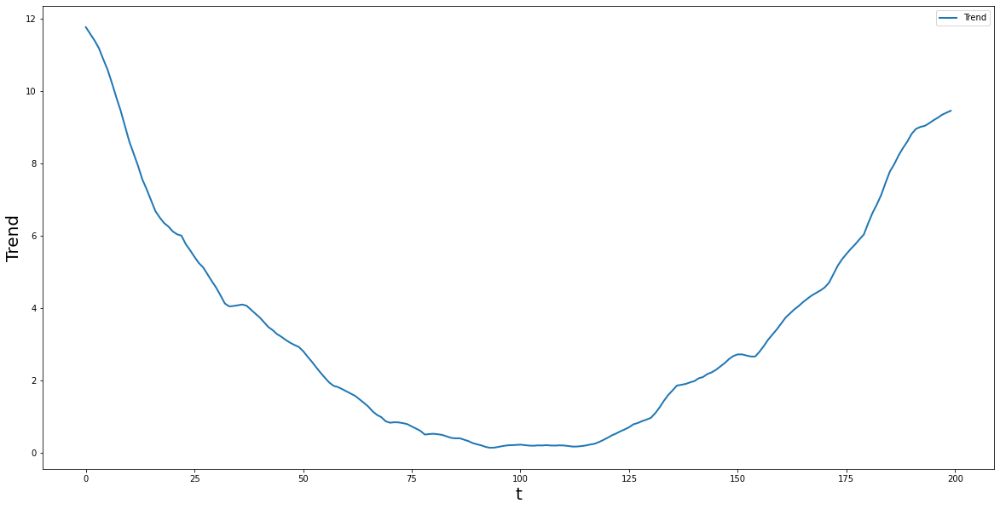

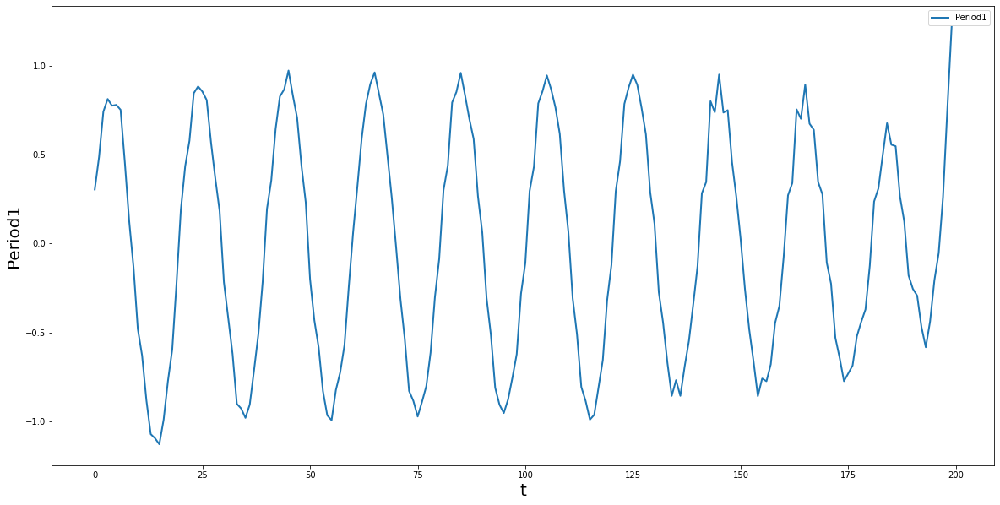

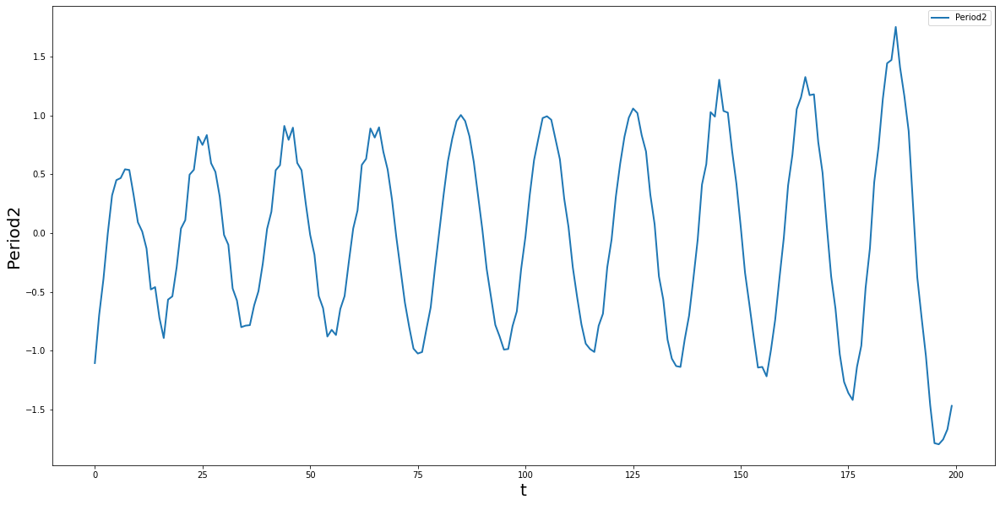

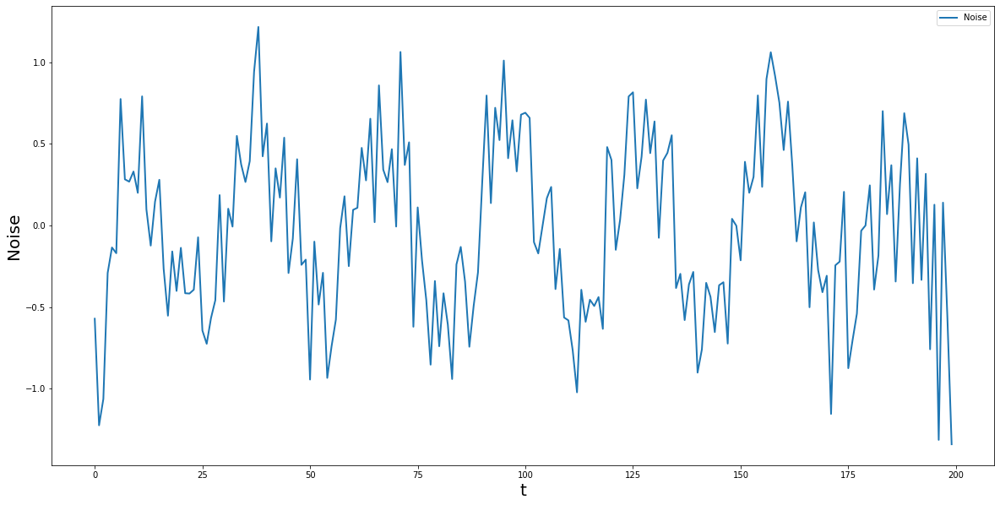

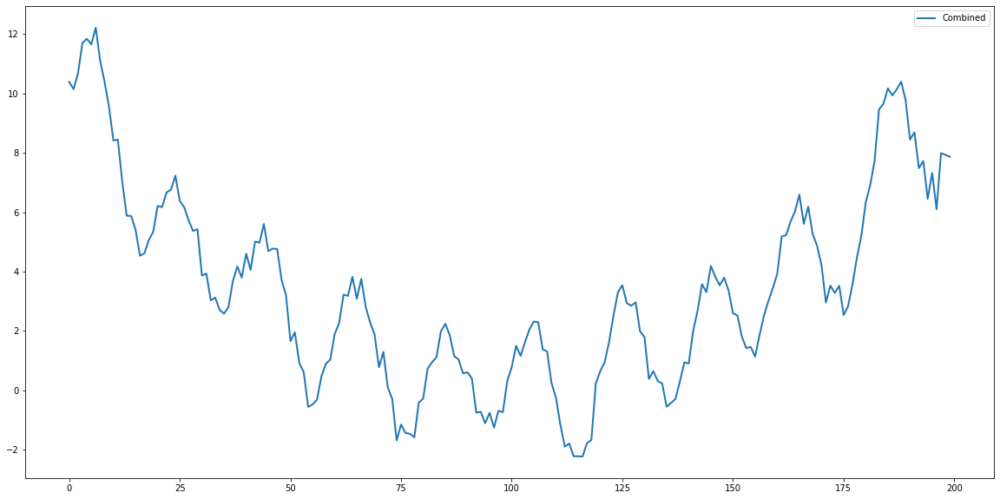

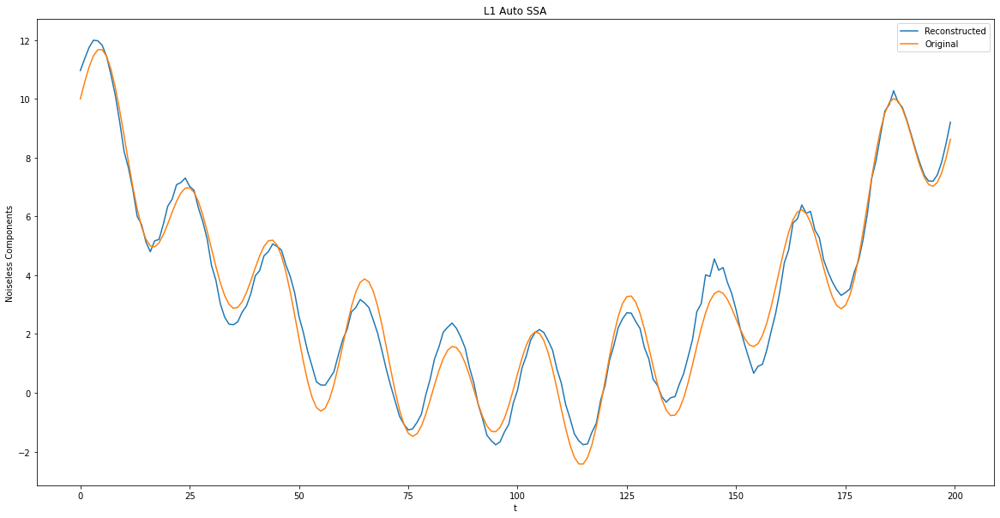

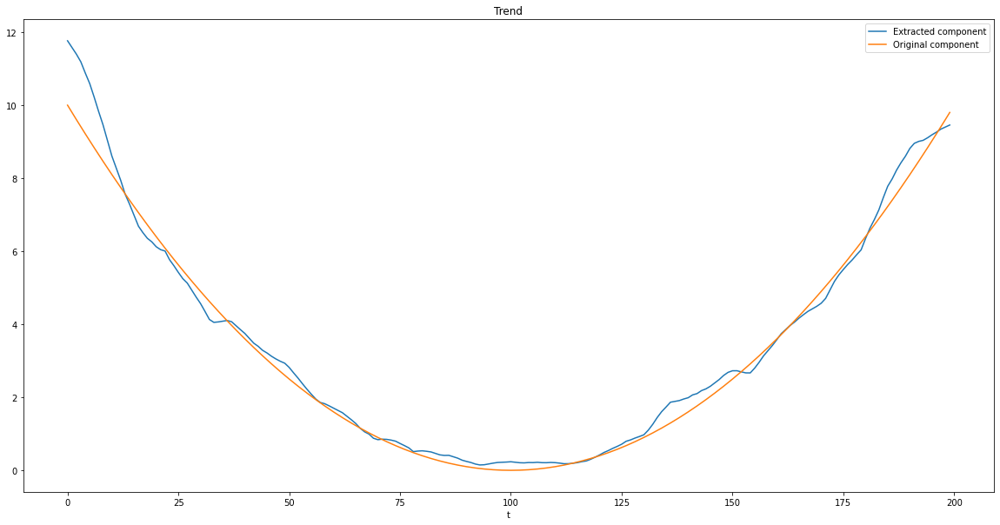

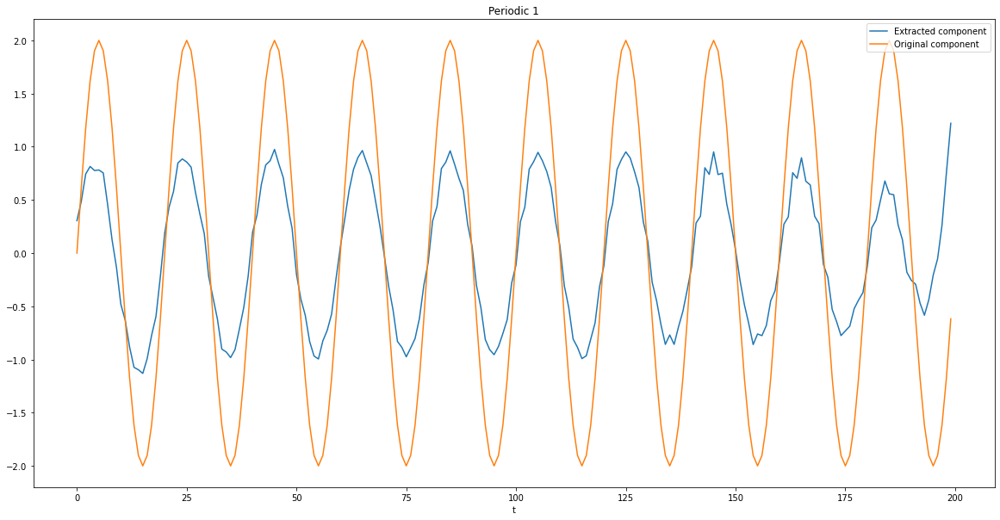

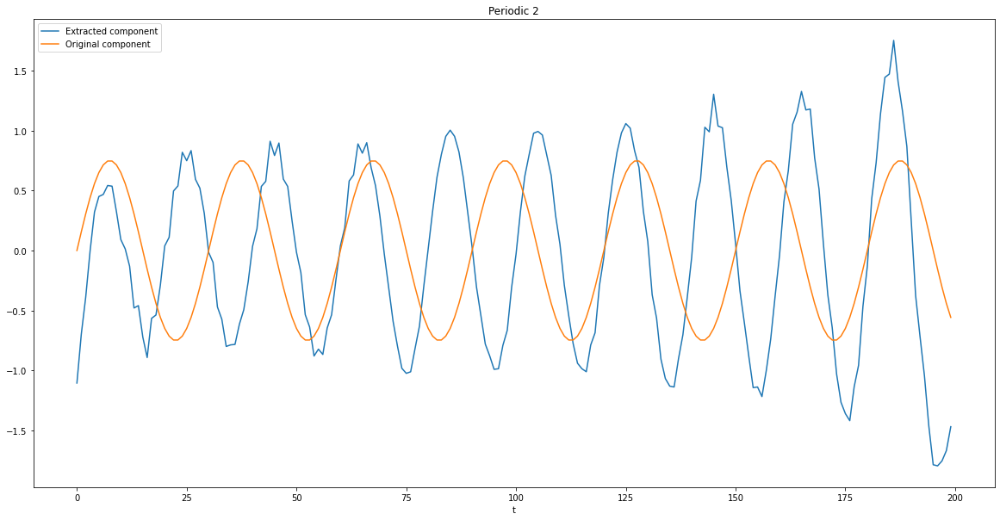

In [ ]:
x = autoSSA(ts,5,70)
'''
[0, 4] -> Periodic
[2,3] -> Trend
[1] -> Noise
'''

[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, x, ([2,3], "Trend"),
                                         ([0], "Period1"), ([4], "Period2"),
                                         ([1], "Noise"))

combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("Auto SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["Auto SSA Signal 1"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per1, periodic1, "Periodic 1"),
                      (per2, periodic2, "Periodic 2"))

#L1 Auto SSA
plt.figure()
x = autoSSA(ts,5,70, True)
'''
[1, 4] -> Periodic
[2,3] -> Trend
[0] -> Noise
'''

[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, x, ([2,3], "Trend"),
                                         ([1], "Period1"), ([4], "Period2"),
                                         ([0], "Noise"))

combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("L1 Auto SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["L1 Auto SSA Signal 1"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per1, periodic1, "Periodic 1"),
                      (per2, periodic2, "Periodic 2"))

# Signal 2

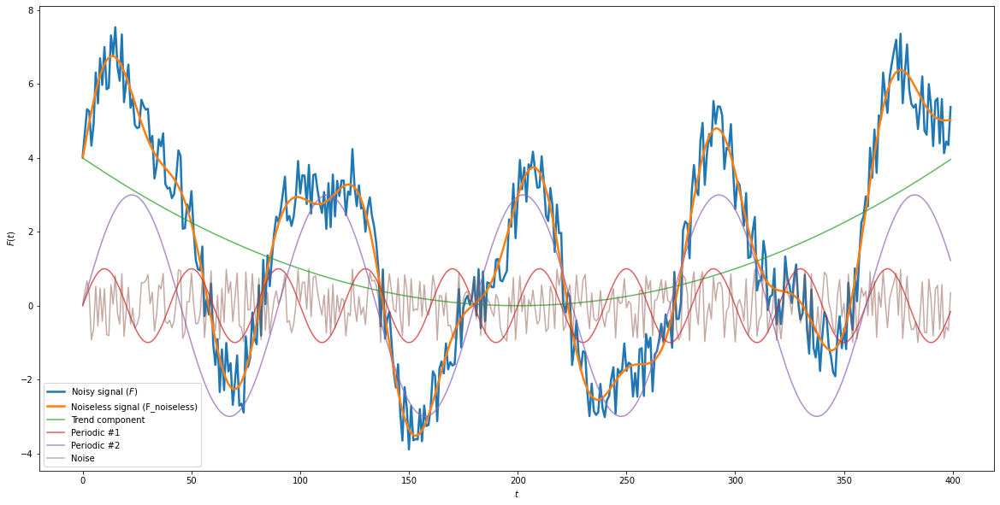

In [ ]:
N = 400
t = np.arange(0,N)
#3 components - 1 trend, 2 periodic
#trend
trend = 0.0001 * (t - 200)**2

#periodic
p1, p2 = 40, 90 #periods
periodic1 = 1 * np.sin(2*pi*t/p1)
periodic2 = 3 * np.sin(2*pi*t/p2)
#Combined periodic
per = periodic1 + periodic2

#Generate noise
np.random.seed(222)
noise = 2 * (np.random.rand(N) - 0.5)
F_noiseless = trend + periodic1 + periodic2
F = F_noiseless + noise

#Plot
plt.figure(figsize=(20,10))
plt.plot(t, F, lw=2.5)
plt.plot(t, F_noiseless, lw =2.5)
plt.plot(t, trend, alpha=0.75)
plt.plot(t, periodic1, alpha=0.75)
plt.plot(t, periodic2, alpha=0.75)
plt.plot(t, noise, alpha=0.5)
plt.legend(["Noisy signal ($F$)", "Noiseless signal (F_noiseless)", "Trend component", "Periodic #1", "Periodic #2", "Noise"])
plt.xlabel("$t$")
plt.ylabel("$F(t)$")
plt.show()

ts = F

Realization length(N):	400
Window Length(L):	70
K:			331
Trajectory Matrix:
[[ 4.05205685  4.69643826  5.31828467 ...  1.11628115  0.08593916
  -0.37211536]
 [ 4.69643826  5.31828467  5.26615609 ...  0.08593916 -0.37211536
  -0.2000945 ]
 [ 5.31828467  5.26615609  4.33034123 ... -0.37211536 -0.2000945
   0.83836405]
 ...
 [-1.78159213 -1.55776459 -2.68746546 ...  5.59289742  4.12773091
   4.44332825]
 [-1.55776459 -2.68746546 -2.06136252 ...  4.12773091  4.44332825
   4.34713874]
 [-2.68746546 -2.06136252 -1.34958059 ...  4.44332825  4.34713874
   5.37608396]]


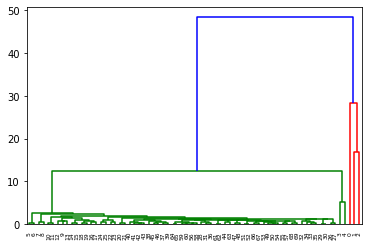

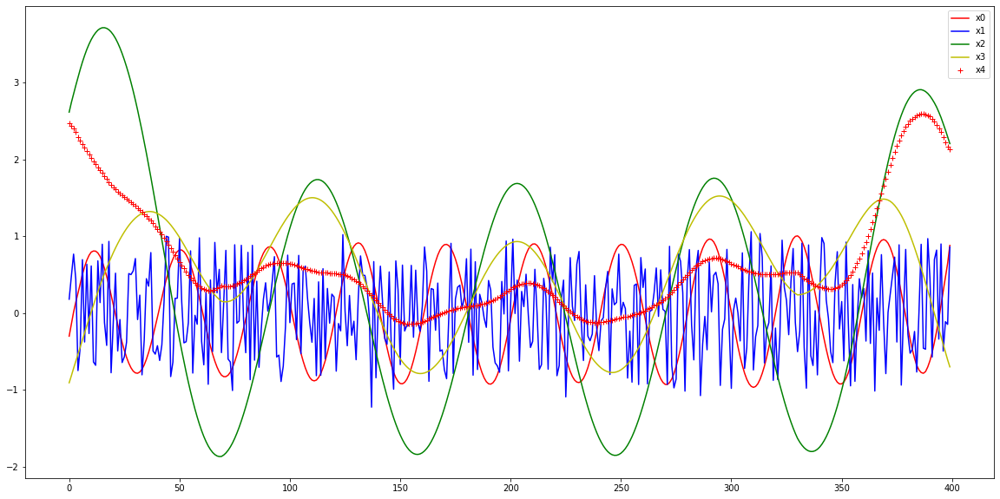

MSE: 0.01488620006806412
Realization length(N):	400
Window Length(L):	70
K:			331
Trajectory Matrix:
[[ 4.05205685  4.69643826  5.31828467 ...  1.11628115  0.08593916
  -0.37211536]
 [ 4.69643826  5.31828467  5.26615609 ...  0.08593916 -0.37211536
  -0.2000945 ]
 [ 5.31828467  5.26615609  4.33034123 ... -0.37211536 -0.2000945
   0.83836405]
 ...
 [-1.78159213 -1.55776459 -2.68746546 ...  5.59289742  4.12773091
   4.44332825]
 [-1.55776459 -2.68746546 -2.06136252 ...  4.12773091  4.44332825
   4.34713874]
 [-2.68746546 -2.06136252 -1.34958059 ...  4.44332825  4.34713874
   5.37608396]]


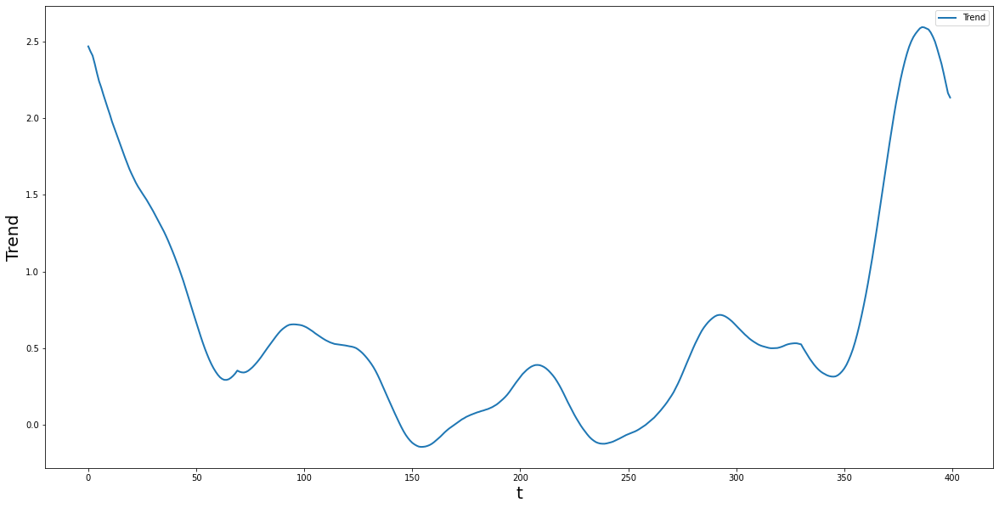

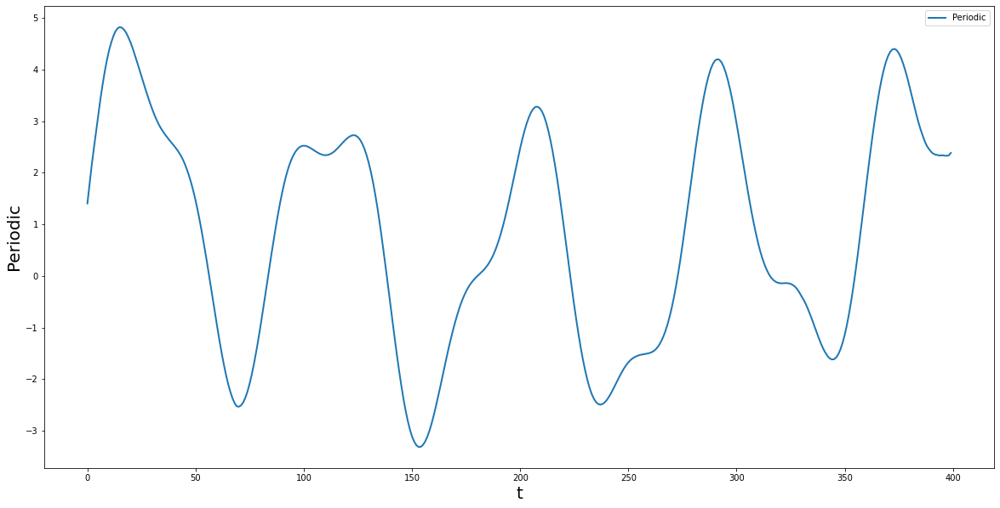

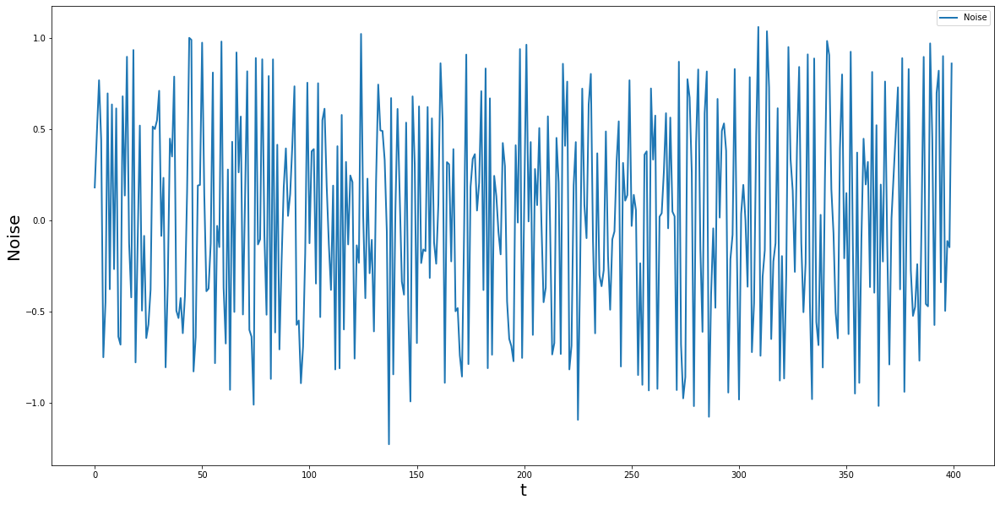

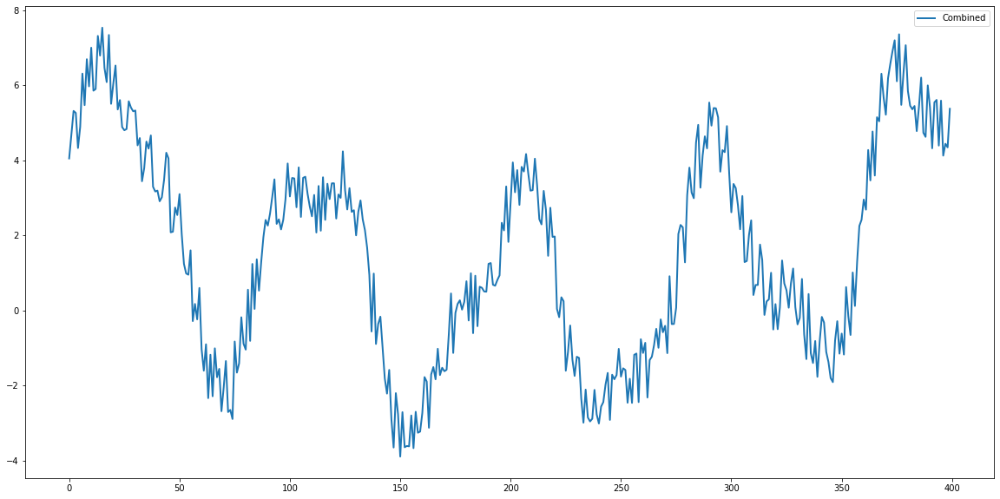

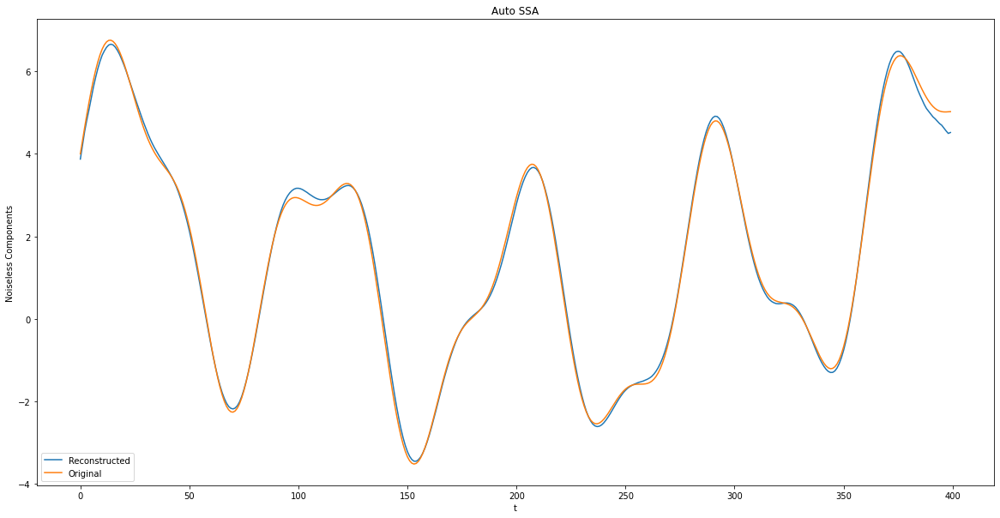

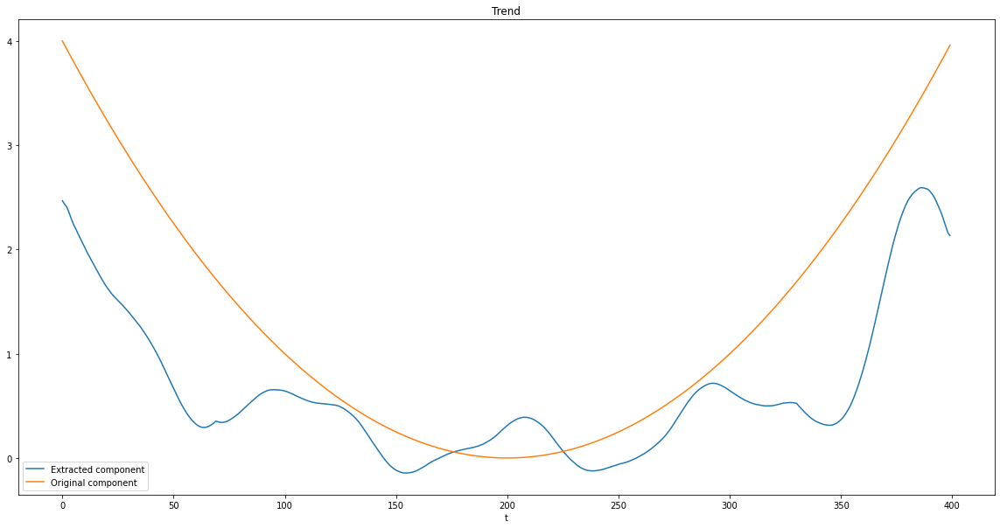

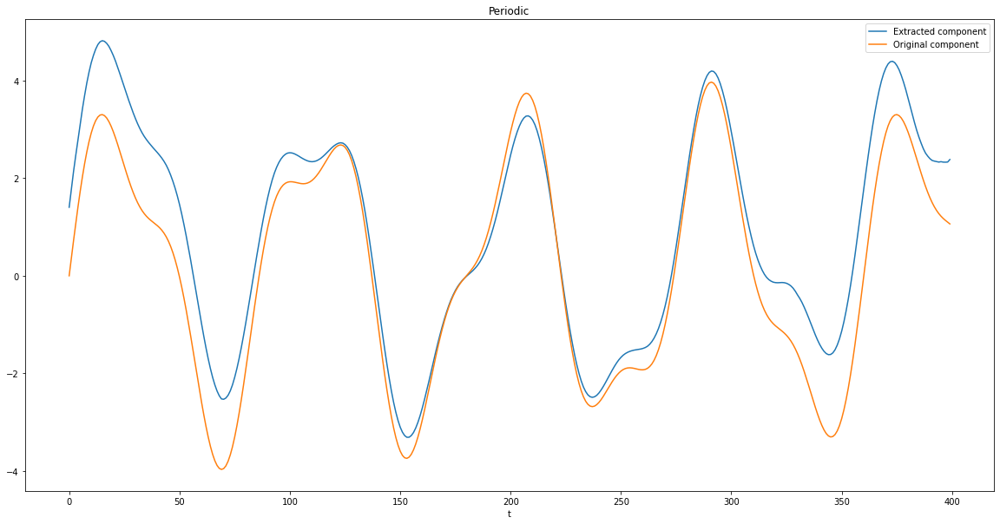

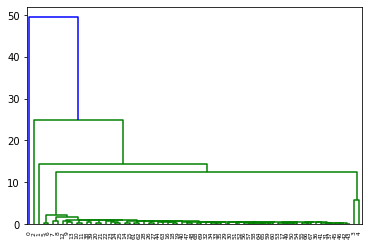

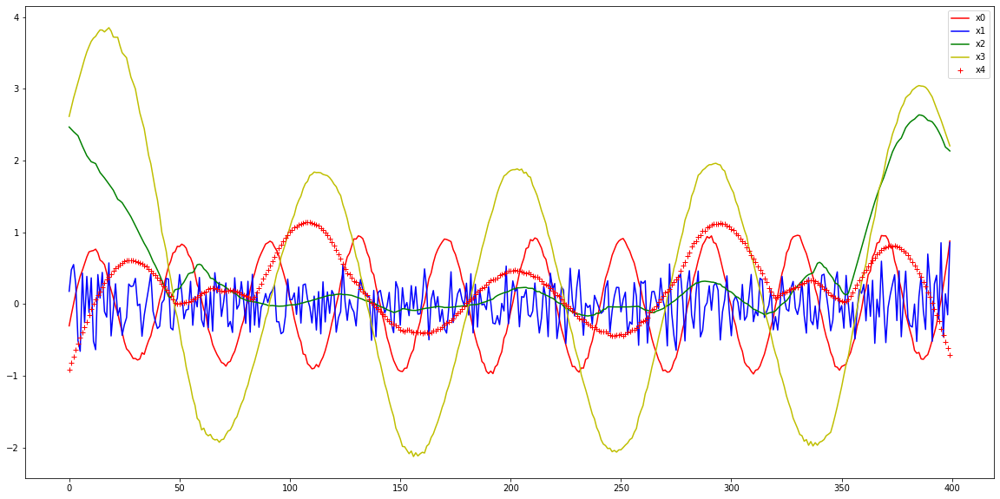

MSE: 0.3772843819197426


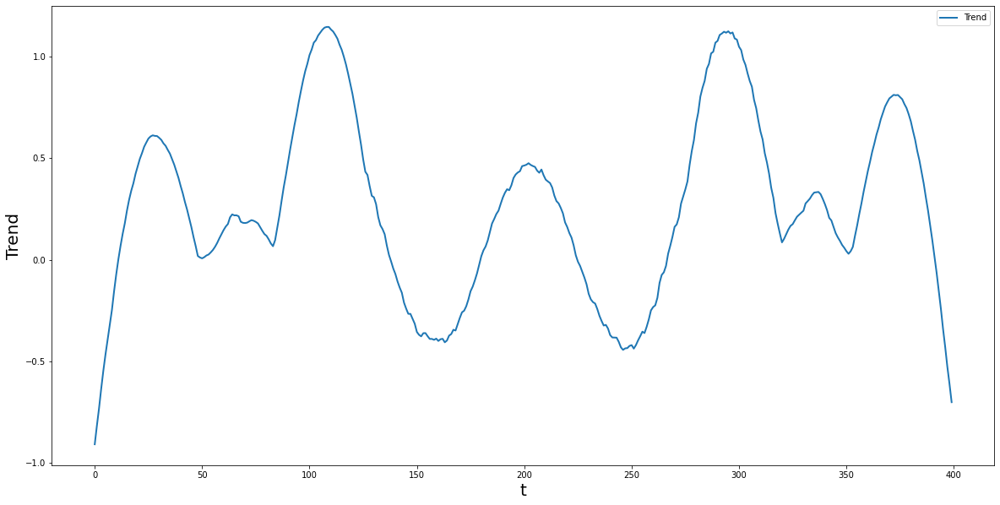

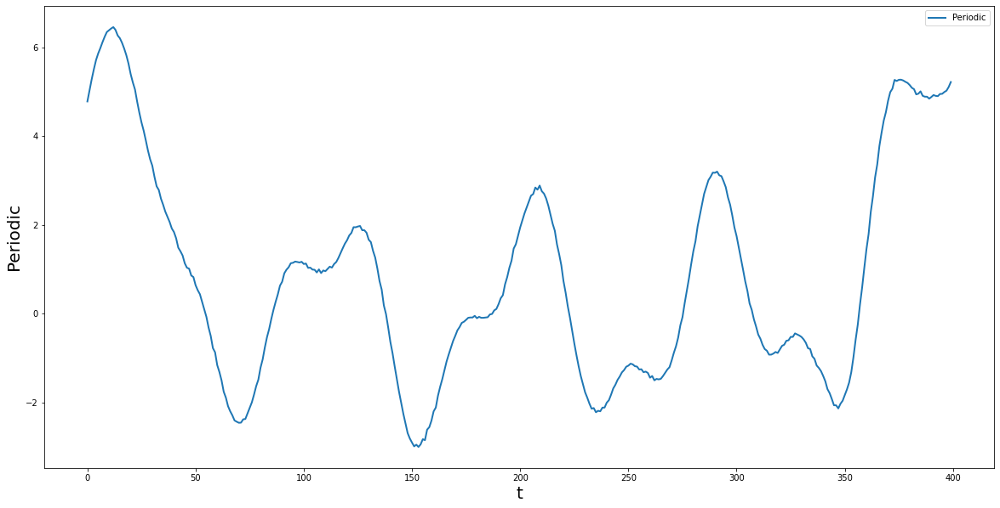

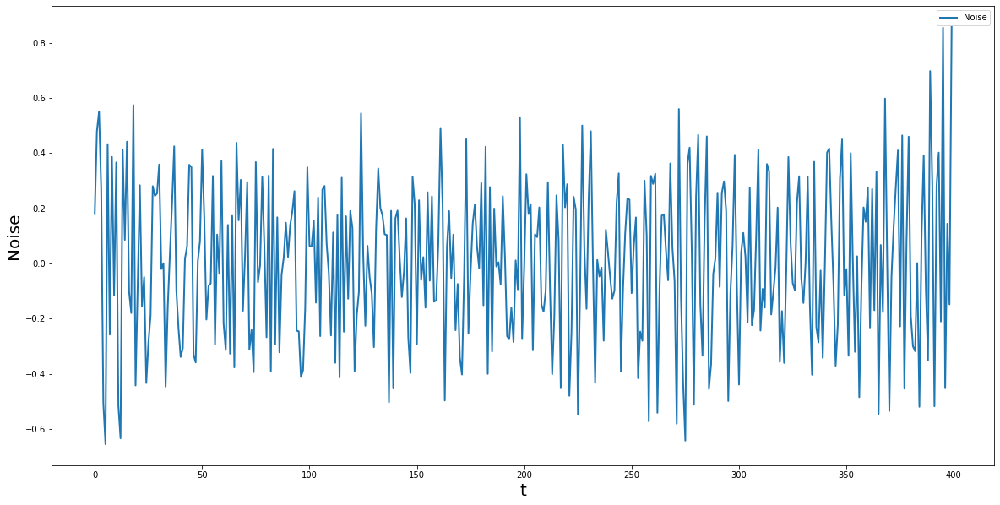

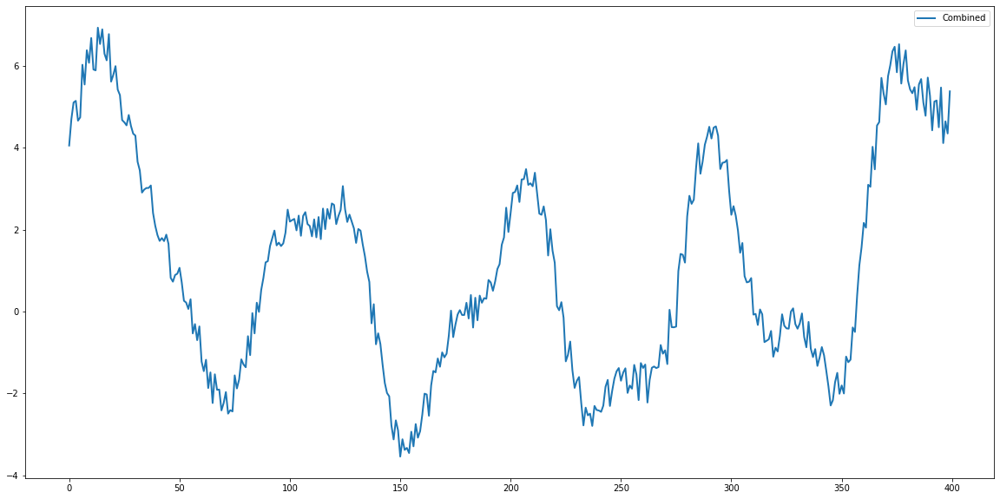

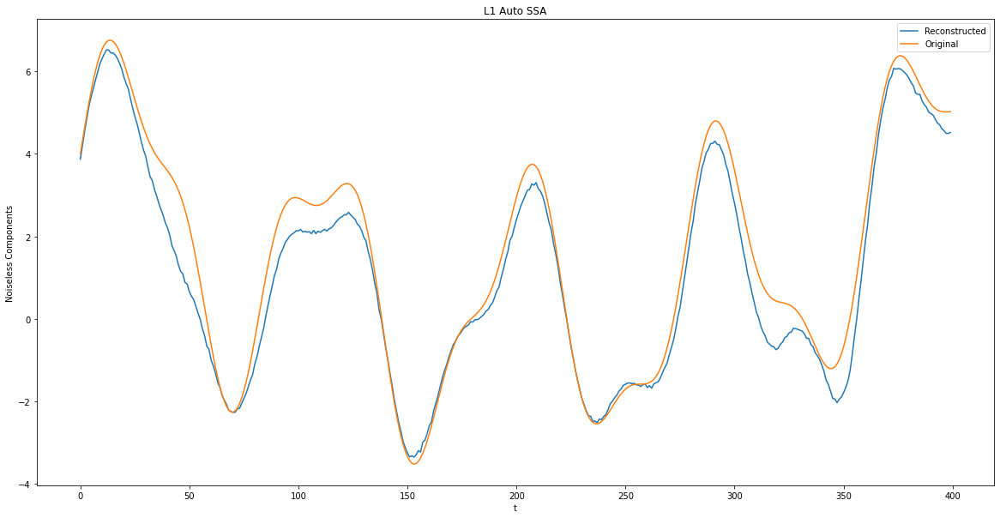

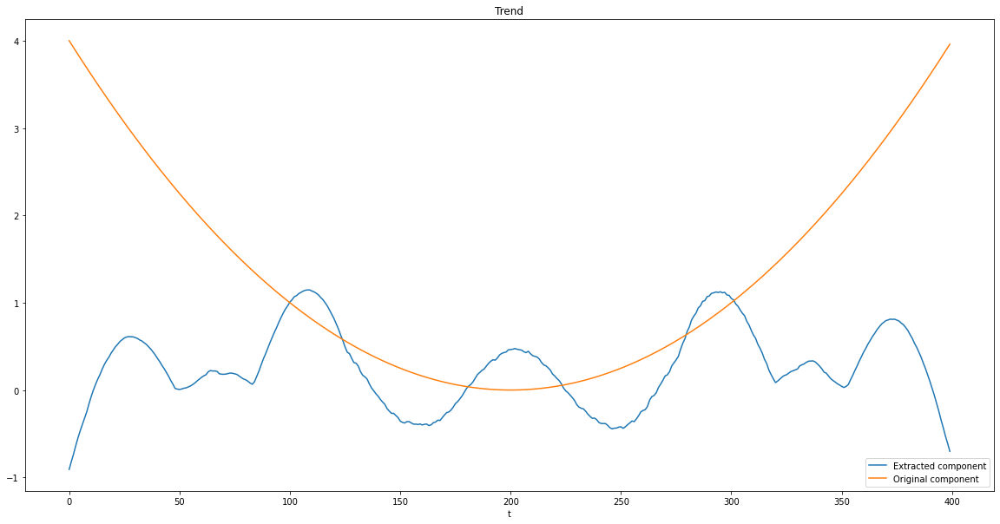

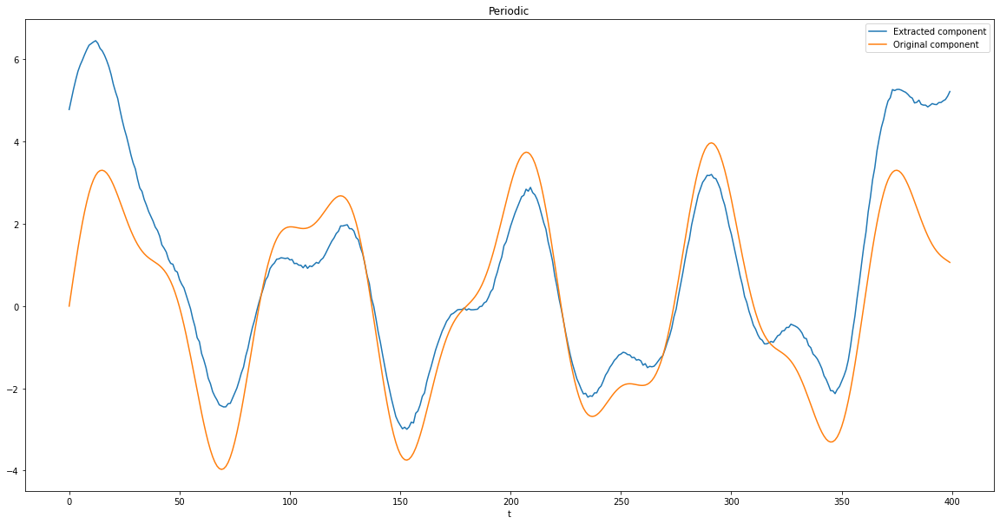

In [ ]:
x = autoSSA(ts,5,70)
'''
[0,2,3] -> Periodic
[4] -> Trend
[1] -> Noise
'''

[trend_comp, per,
 noise_comp, combined] = plot_components(N, x, ([4], "Trend"),
                                         ([0,2,3], "Periodic"), ([1], "Noise"))

combined_noiseless = trend_comp + per
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("Auto SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["Auto SSA Signal 2"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per, periodic1+periodic2, "Periodic")
                      )

#L1 Auto SSA
plt.figure()
x = autoSSA(ts,5,70, True)
'''
[0,3,4] -> Periodic
[2] -> Trend
[1] -> Noise
'''

[trend_comp, per,
 noise_comp, combined] = plot_components(N, x, ([4], "Trend"),
                                         ([0,2,3], "Periodic"), ([1], "Noise"))

combined_noiseless = trend_comp + per
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("L1 Auto SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["L1 Auto SSA Signal 2"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per, periodic1+periodic2, "Periodic")
                      )

# Circulant SSA

In [ ]:
def build_traj(ts,L):
    '''
    Builds a trajectory matrix out of the time series
    '''
    T = len(ts) #Length of time series
    #L = Window Length
    N = T-L+1 #Number of columns in the trajectory matrix
    print(f'Realization length(T):\t{T}\nWindow Length(L):\t{L}\nN:\t\t\t{N}')
    X = np.column_stack([ts[i:i+L] for i in range(N)])
    print(f"Trajectory Matrix:\n{X}")
    return X

def calc_gamma(ts, L):
    T = len(ts)
    gamma = []
    for m in range(L):
        sum = 0
        for t in range(1,T-m+1):
            sum += ts[t-1]*ts[t+m-1]
        gamma.append((1/(T-m))*sum)
    return gamma
def build_circulant_matrix(L, gamma):
    '''
    build circulant matrix
    '''
    sc = []
    Sc = []
    for m in range(L):
        c = ((L-m)/L)*gamma[m] + (m/L)*gamma[L-m-1]
        sc.append(c)
    for m in range(L):
        sc1 = sc[-m:] + sc[:-m]
        Sc.append(sc1)
    Sc = np.array(Sc)
    Sc.resize(L,L)
    return Sc

def calc_eig(Sc):
    lam, u = np.linalg.eig(Sc)
    return lam, u

def elem_mat(u, X):
    wk = []
    Xk = []
    for k in range(1,L+1):
        wk.append(k-1/L)
        uk = np.matrix(u[:,k-1])
        Xk.append(np.outer(uk,uk.getH())@X)
    return Xk

def group_by_freq(Xk, lam):
    XB = []
    lam1 = []
    XB.append(Xk[0])
    lam1.append(lam[0])
    m = int(np.floor((L-1)/2))
    for k in range(0,m,2):
        XB.append(Xk[k+1] + Xk[k+2])
        lam1.append(lam[k+1] + lam[k+2])
    if L%2==0:
        XB.append(Xk[-1])
        lam1.append(lam[-1])
    XB_real = np.real(XB)
    return XB_real

def X_to_TS(X, L1 = False):
    '''
    Helper function to perform diagonal averaging over the anti diagonals of a
    given matrix
    If L1 is True, returns the diagonal median over the antidiagonals (used in
    L1 SSA)
    '''
    X_rev = np.fliplr(X)
    m,n = np.shape(X)
    if L1:
        x = np.array([np.median(X_rev.diagonal(i)) for i in range(-m+1, n)])
    else:
        x = np.array([X_rev.diagonal(i).mean() for i in range(-m+1, n)])
    return x[::-1]


def plot_matrices(XB_real, N):
    plt.figure(figsize= (40,20))
    for i in range(len(XB_real)):
        m,n = np.shape(XB_real[i])
        F_i = X_to_TS(XB_real[i])
        plt.plot(range(N), F_i, lw=2, label = f'F{i}')
        plt.xlabel("t", fontsize = 20, color = 'r')
        plt.ylabel("Reconstructed component", fontsize = 20, color = 'r')
    plt.legend()

def plot_components(N, X_elem, L1 = False, *args):
    '''
    N = length of time series
    ([indices], comp_name)
    '''
    comps = []
    for (comp_list, comp_name) in args:
        comp = np.zeros(N)
        plt.figure(figsize= (20,10))
        plt.title(comp_name.upper(), fontsize = 20)
        plt.xlabel("t", fontsize = 20, color = 'r')
        plt.ylabel(comp_name.capitalize(), fontsize = 20, color = 'r')

        for i in comp_list:
            F_i = X_to_TS(X_elem[i], L1)
            comp += F_i
            plt.plot(t, F_i, lw=2, label = f'F{i}')
        plt.plot(t, comp, lw=2, label = comp_name.capitalize())
        plt.legend()

        comps.append(comp)

    combined = np.zeros(N)
    for comp in comps:
        combined += comp
    comps.append(combined)
    plt.figure(figsize= (20,10))
    plt.title("COMBINED(noisy)", fontsize = 20)
    plt.xlabel("t", fontsize = 20, color = 'r')
    plt.ylabel("Combined", fontsize = 20, color = 'r')
    plt.plot(t, combined, lw=2, label = "Combined")

    return comps


# Signal 1

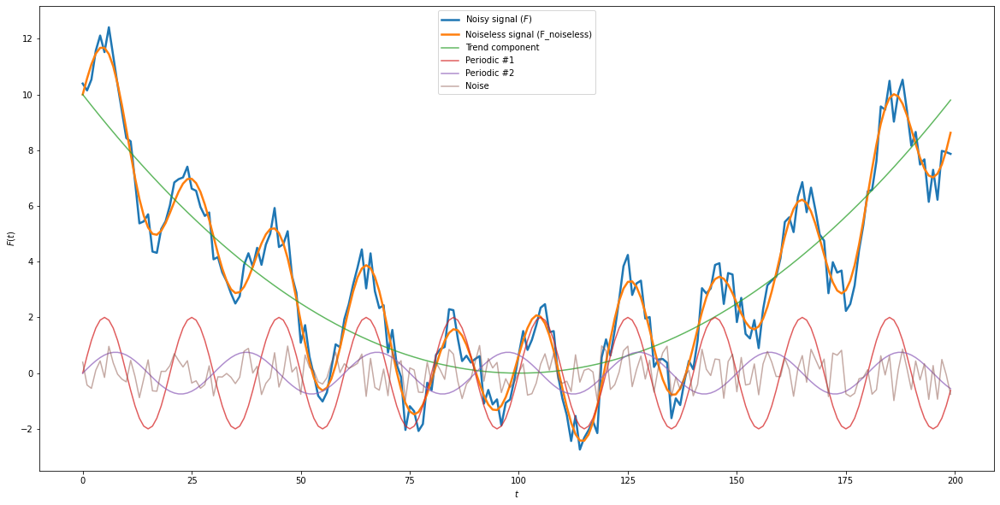

In [ ]:
N = 200
t = np.arange(0,N)
#3 components - 1 trend, 2 periodic
#trend
trend = 0.001 * (t - 100)**2

#periodic
p1, p2 = 20, 30 #periods
periodic1 = 2 * np.sin(2*pi*t/p1)
periodic2 = 0.75 * np.sin(2*pi*t/p2)
#Combined periodic
per = periodic1 + periodic2

#Generate noise
np.random.seed(123)
noise = 2 * (np.random.rand(N) - 0.5)
F_noiseless = trend + periodic1 + periodic2
F = F_noiseless + noise

#Plot
plt.figure(figsize=(20,10))
plt.plot(t, F, lw=2.5)
plt.plot(t, F_noiseless, lw =2.5)
plt.plot(t, trend, alpha=0.75)
plt.plot(t, periodic1, alpha=0.75)
plt.plot(t, periodic2, alpha=0.75)
plt.plot(t, noise, alpha=0.5)
plt.legend(["Noisy signal ($F$)", "Noiseless signal (F_noiseless)", "Trend component", "Periodic #1", "Periodic #2", "Noise"])
plt.xlabel("$t$")
plt.ylabel("$F(t)$")
plt.show()

ts = F

MSE: 0.6384379845173099
MSE: 0.6805634817502605


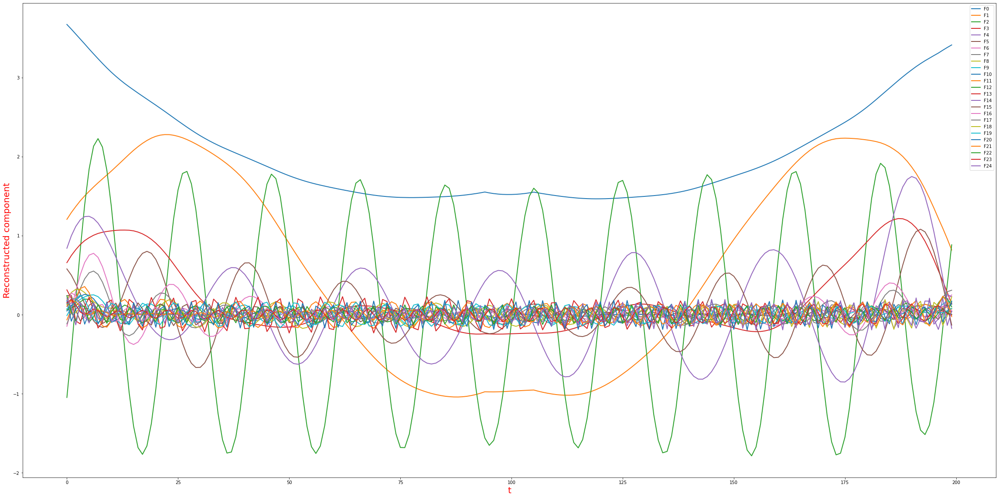

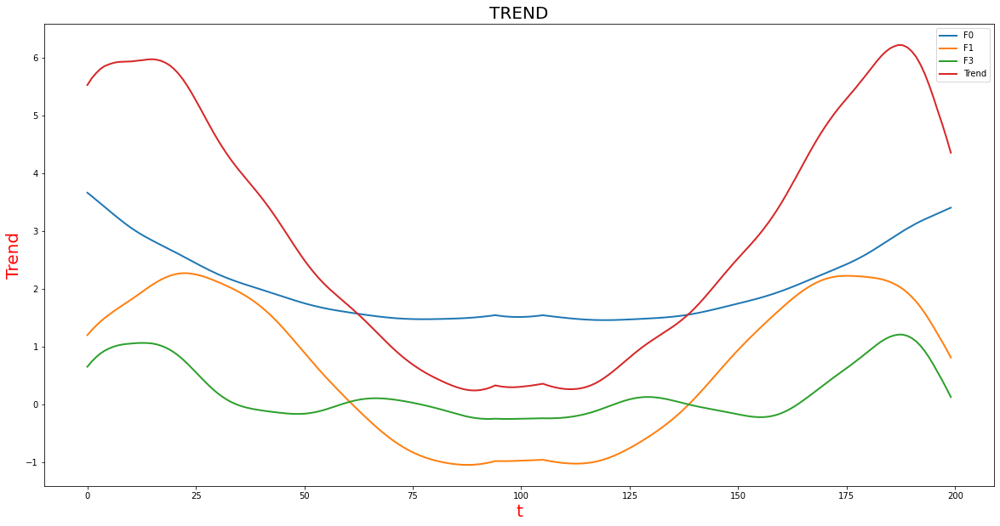

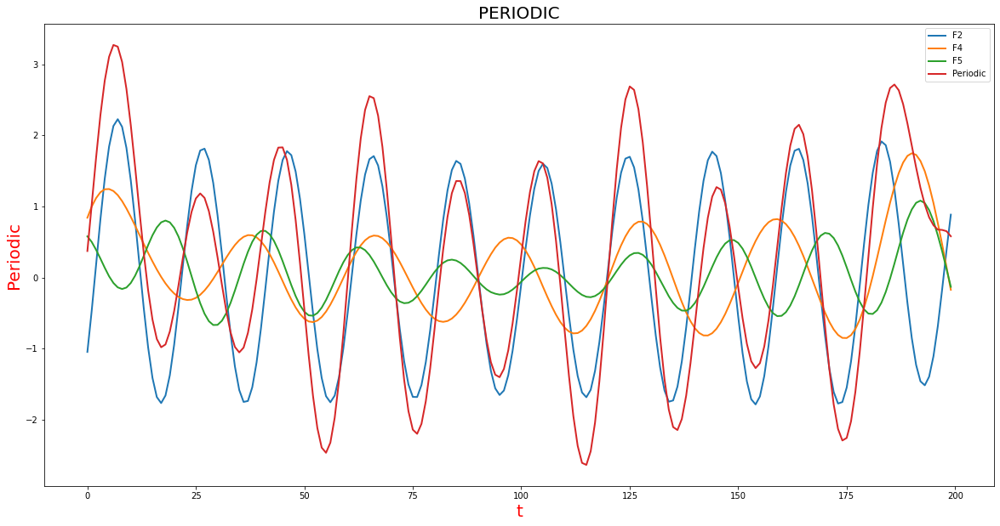

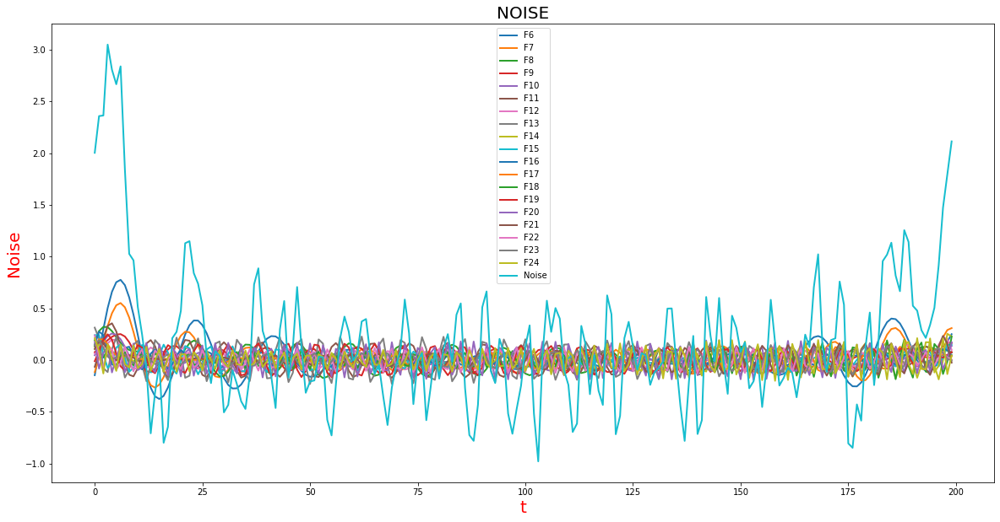

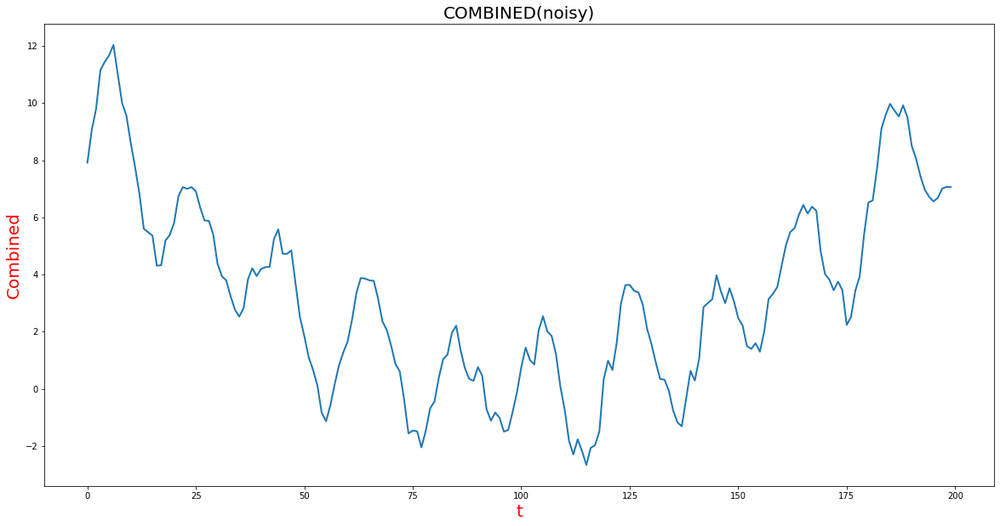

...

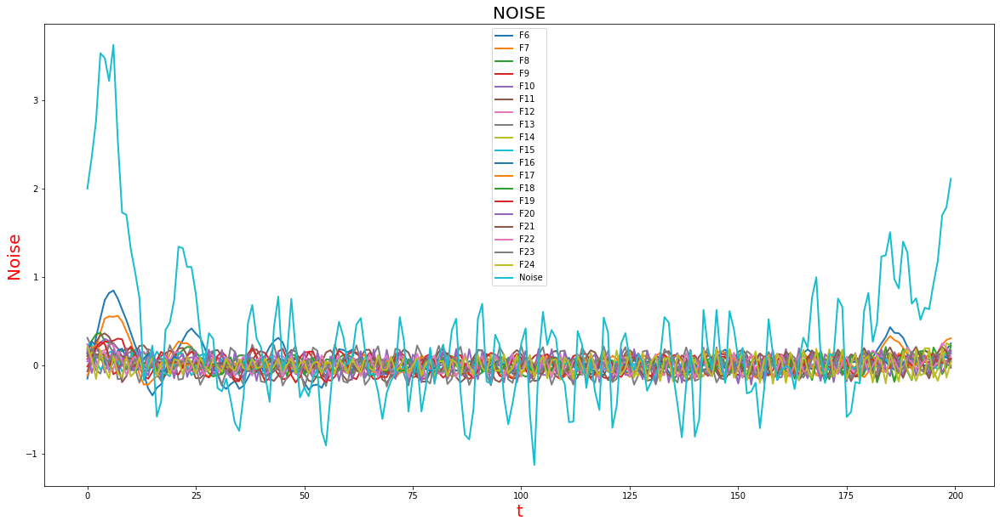

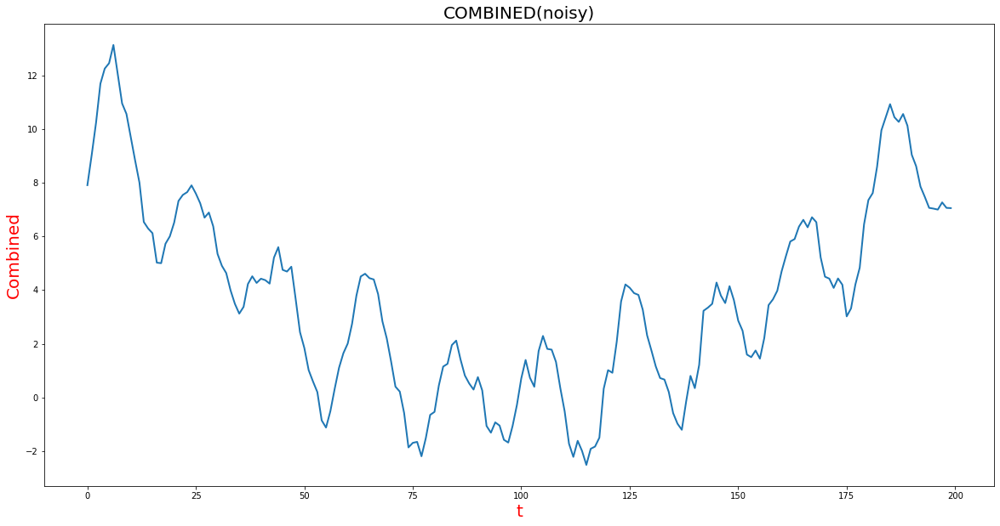

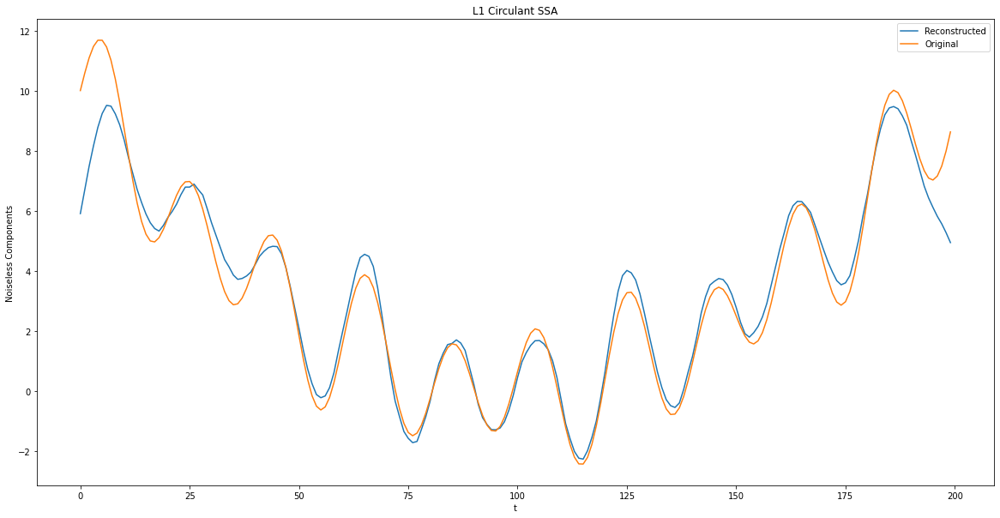

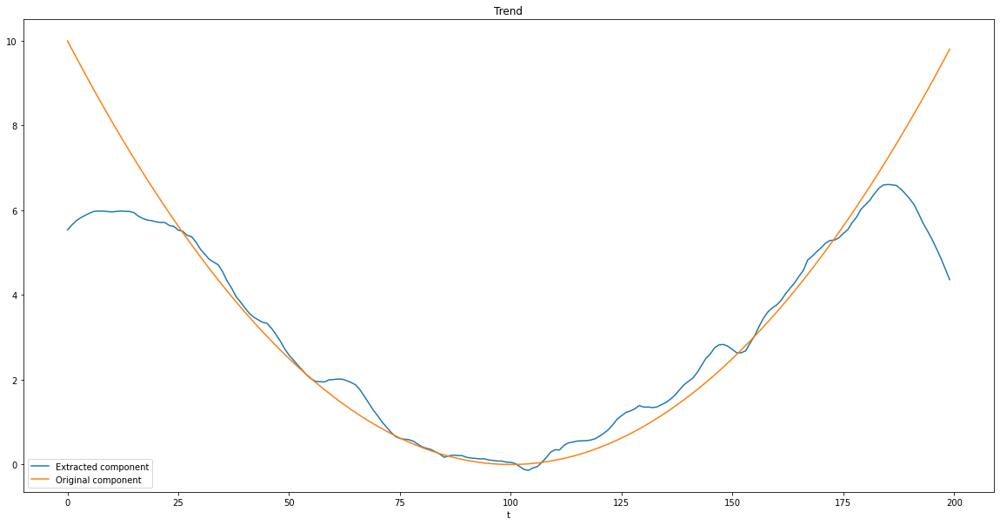

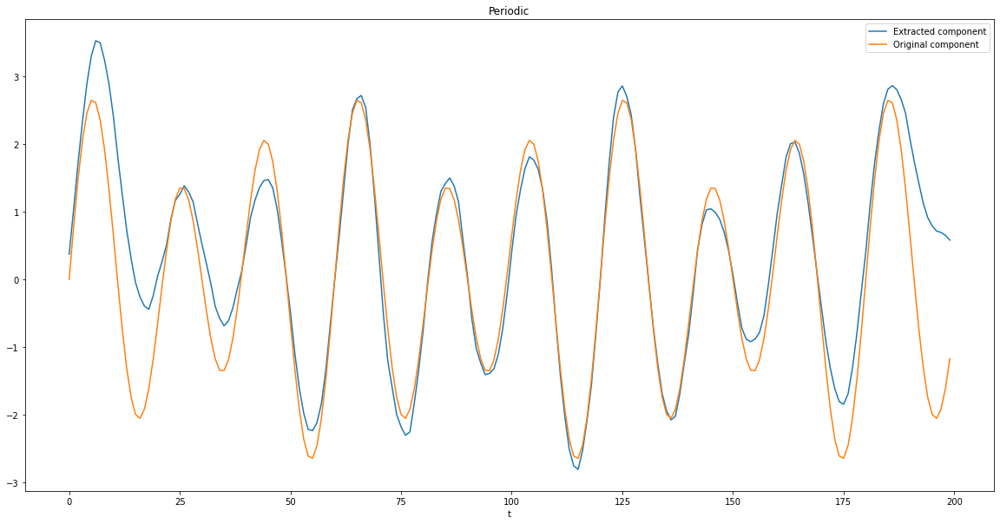

In [ ]:
L = 95
X = build_traj_mat(ts, L)
gamma = calc_gamma(ts, L)
Sc = build_circulant_matrix(L, gamma)
lam, u = calc_eig(Sc)
Xk = elem_mat(u, X)
XB_real = group_by_freq(Xk, lam)
plot_matrices(XB_real, N)

'''
[0,1,3] -> Trend
[2,4,5] -> Periodic
[6:]
'''
[trend_comp, per,
 noise_comp, combined] = plot_components(N, XB_real, False, ([0,1,3], "Trend"),
                                         ([2,4,5], "Periodic"),
                                         (range(6,len(XB_real)), "Noise"))

combined_noiseless = trend_comp + per
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("Circulant SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["Circulant SSA Signal 1"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per, periodic1+periodic2, "Periodic"))

#L1 Circulant
[trend_comp, per,
 noise_comp, combined] = plot_components(N, XB_real, True, ([0,1,3], "Trend"),
                                         ([2,4,5], "Periodic"),
                                         (range(6,len(XB_real)), "Noise"))

combined_noiseless = trend_comp + per
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("L1 Circulant SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["L1 Circulant SSA Signal 1"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per, periodic1+periodic2, "Periodic"))

# Signal 2

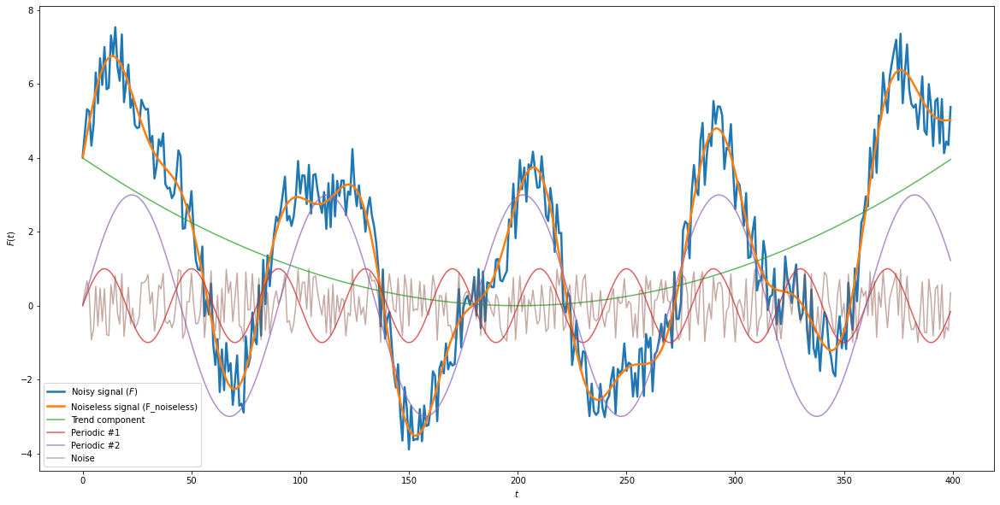

In [ ]:
N = 400
t = np.arange(0,N)
#3 components - 1 trend, 2 periodic
#trend
trend = 0.0001 * (t - 200)**2

#periodic
p1, p2 = 40, 90 #periods
periodic1 = 1 * np.sin(2*pi*t/p1)
periodic2 = 3 * np.sin(2*pi*t/p2)
#Combined periodic
per = periodic1 + periodic2

#Generate noise
np.random.seed(222)
noise = 2 * (np.random.rand(N) - 0.5)
F_noiseless = trend + periodic1 + periodic2
F = F_noiseless + noise

#Plot
plt.figure(figsize=(20,10))
plt.plot(t, F, lw=2.5)
plt.plot(t, F_noiseless, lw =2.5)
plt.plot(t, trend, alpha=0.75)
plt.plot(t, periodic1, alpha=0.75)
plt.plot(t, periodic2, alpha=0.75)
plt.plot(t, noise, alpha=0.5)
plt.legend(["Noisy signal ($F$)", "Noiseless signal (F_noiseless)", "Trend component", "Periodic #1", "Periodic #2", "Noise"])
plt.xlabel("$t$")
plt.ylabel("$F(t)$")
plt.show()

ts = F

MSE: 0.2156725347534092
MSE: 0.19958569591869765


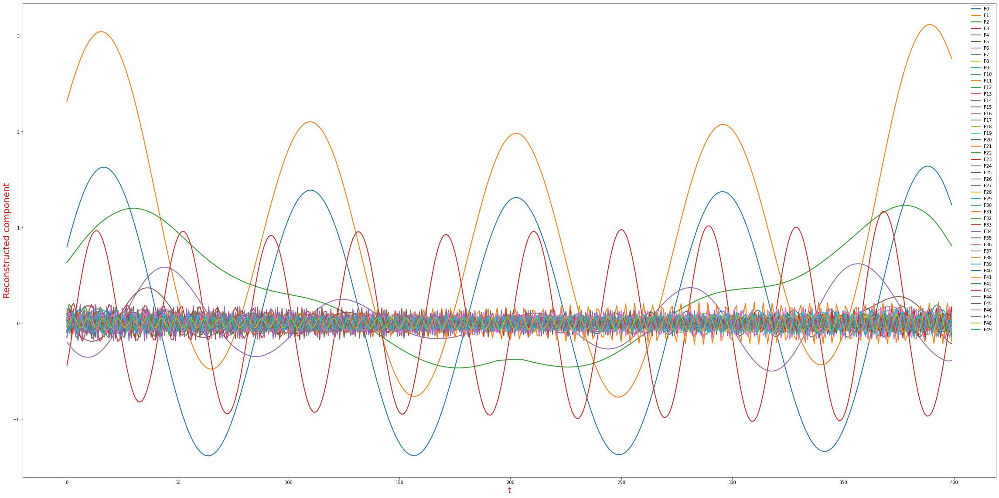

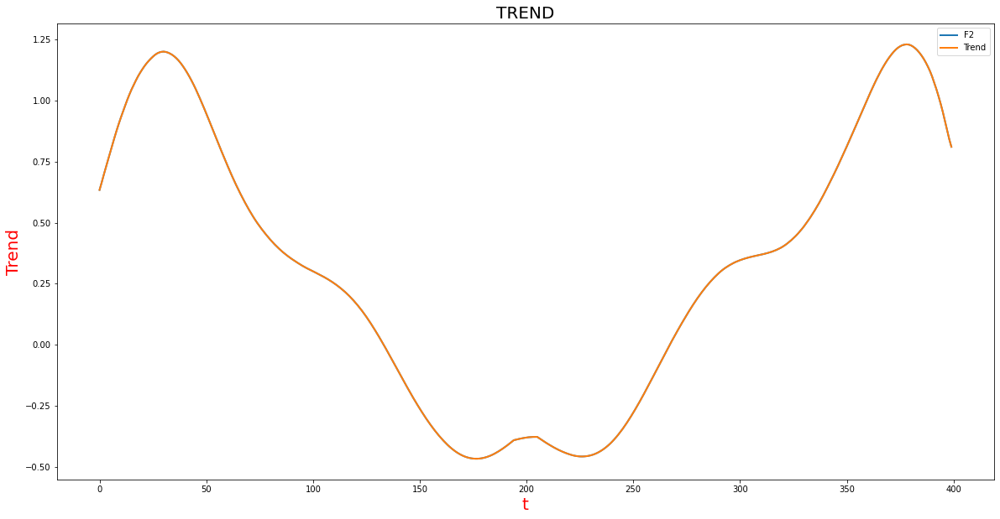

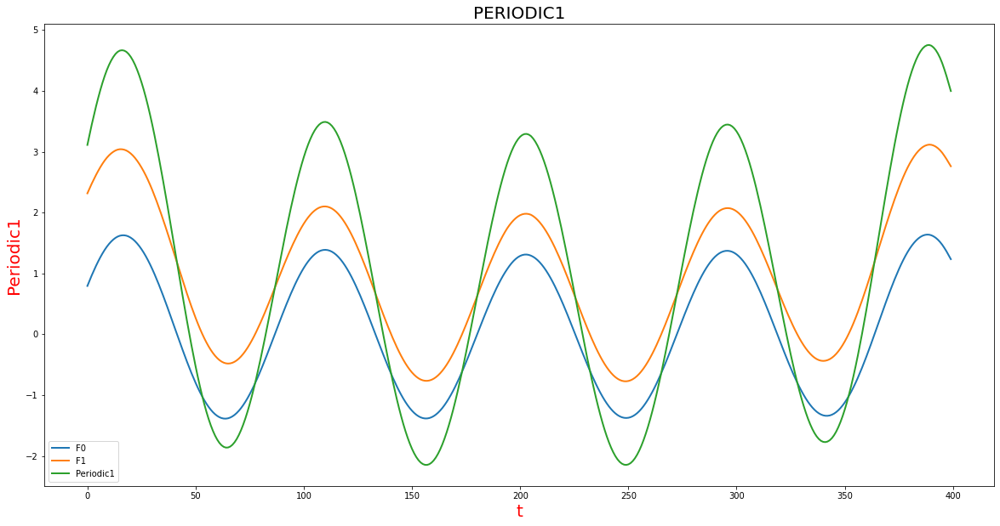

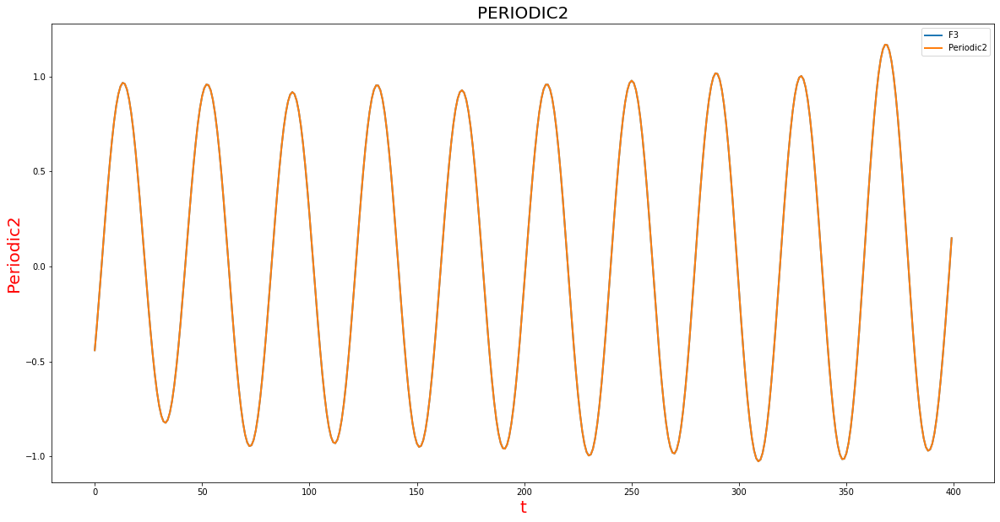

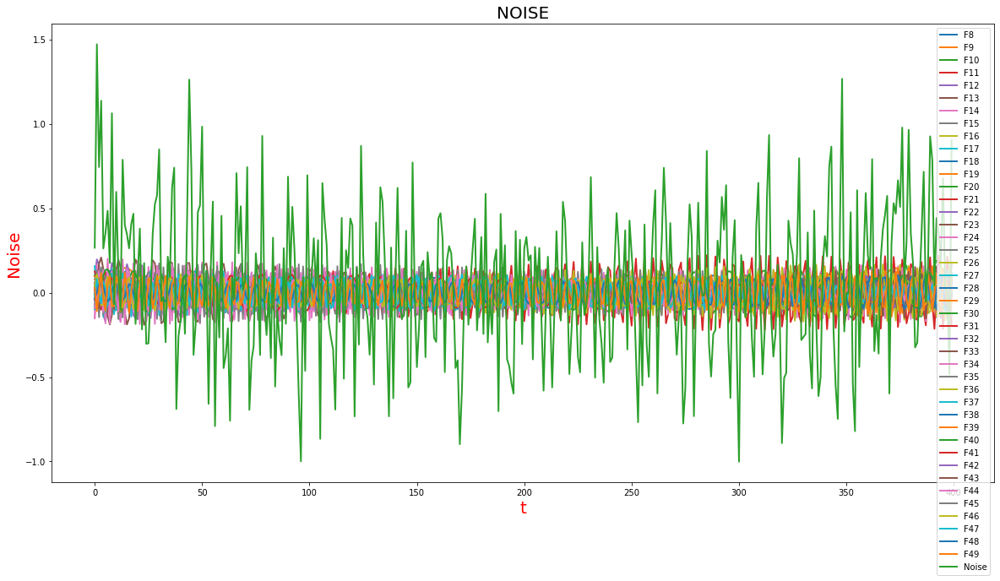

...

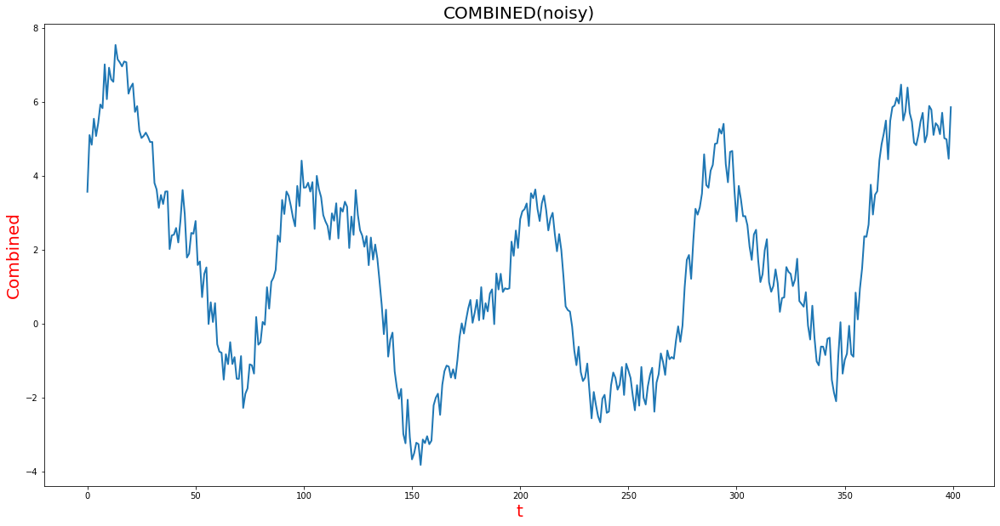

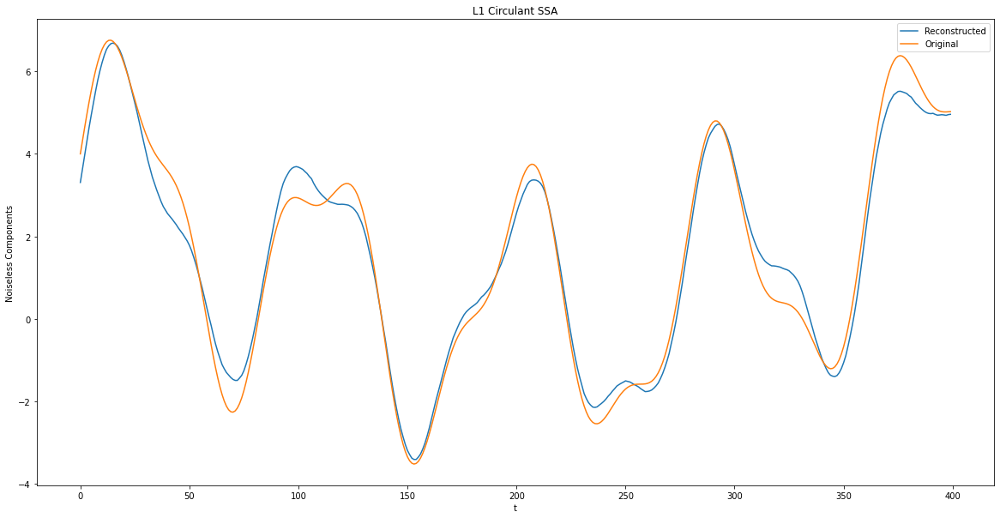

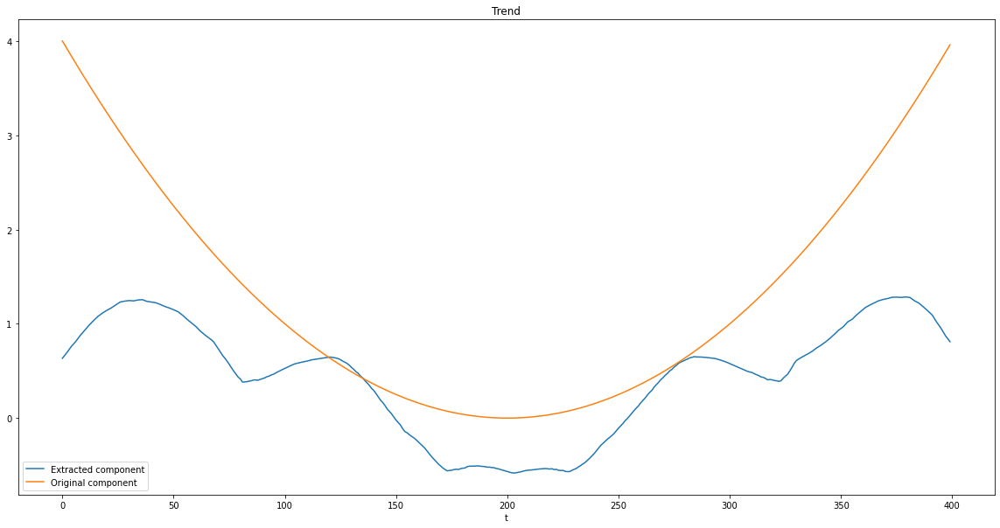

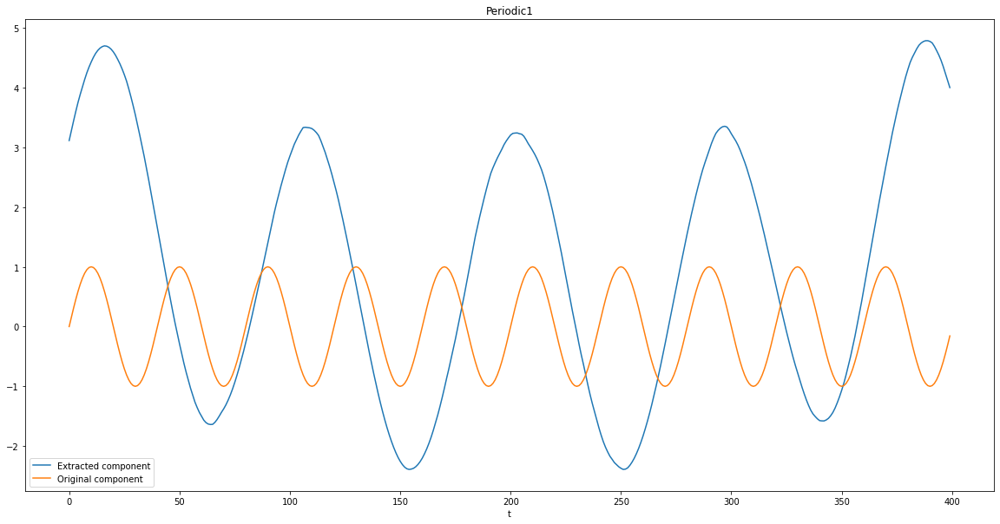

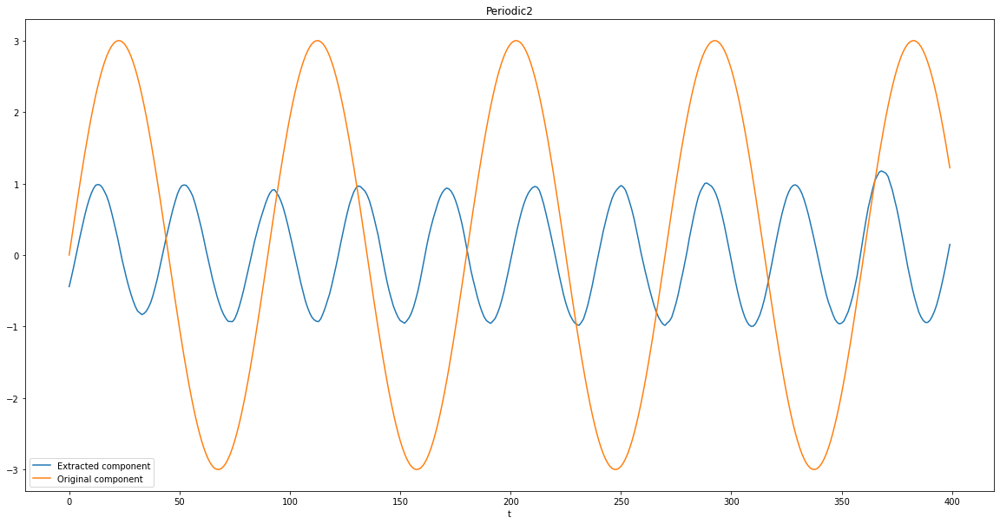

In [ ]:
L = 195
X = build_traj_mat(ts, L)
gamma = calc_gamma(ts, L)
Sc = build_circulant_matrix(L, gamma)
lam, u = calc_eig(Sc)
Xk = elem_mat(u, X)
XB_real = group_by_freq(Xk, lam)
plot_matrices(XB_real, N)

'''
[2] -> Trend
[0,1] -> Periodic1
[3] -> Periodic2
[4:]
'''
[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, XB_real, False, ([2], "Trend"),
                                         ([0,1], "Periodic1"),([3], "Periodic2"),
                                         (range(8,len(XB_real)), "Noise"))

combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("Circulant SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["Circulant SSA Signal 2"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per1, periodic1, "Periodic1"),
                      (per2, periodic2, "Periodic2"))

# #L1 Circulant
[trend_comp, per1, per2,
 noise_comp, combined] = plot_components(N, XB_real, True, ([2], "Trend"),
                                         ([0,1], "Periodic1"),([3], "Periodic2"),
                                         (range(8,len(XB_real)), "Noise"))

combined_noiseless = trend_comp + per1 + per2
plt.figure(figsize=(20,10))
plt.plot(t,(combined_noiseless), label = "Reconstructed")
plt.plot(t, F_noiseless, label = "Original")
plt.xlabel("t")
plt.ylabel("Noiseless Components")
plt.title("L1 Circulant SSA")
plt.legend()

err = mse(F_noiseless, combined_noiseless)
print(f"MSE: {err}")
performance["L1 Circulant SSA Signal 2"] = err

plot_against_original((trend_comp, trend, "Trend"),
                      (per1, periodic1, "Periodic1"),
                      (per2, periodic2, "Periodic2"))

# Performance of all variations


In [ ]:
print("SIGNAL 1".center(45,"="))
print("Basic SSA:\t\t", performance["Basic SSA Signal 1"])
print("L1 SSA:\t\t\t", performance["L1 Signal 1"])
print("Auto SSA:\t\t", performance["Auto SSA Signal 1"])
print("L1 Auto SSA:\t\t", performance["L1 Auto SSA Signal 1"])
print("Circulant SSA:\t\t", performance["Circulant SSA Signal 1"])
print("L1 Circulant SSA:\t", performance["L1 Circulant SSA Signal 1"])
print("\n")
print("SIGNAL 2".center(45,"="))
print("Basic SSA:\t\t", performance["Basic SSA Signal 2"])
print("L1 SSA:\t\t\t", performance["L1 Signal 2"])
print("Auto SSA:\t\t", performance["Auto SSA Signal 2"])
print("L1 Auto SSA:\t\t", performance["L1 Auto SSA Signal 2"])
print("Circulant SSA:\t\t", performance["Circulant SSA Signal 2"])
print("L1 Circulant SSA:\t", performance["L1 Circulant SSA Signal 2"])

===================SIGNAL 1==================
Basic SSA:		 0.023552562848239214
L1 SSA:			 0.07153660045998335
Auto SSA:		 0.023552562848239214
L1 Auto SSA:		 0.29301833081713263
Circulant SSA:		 0.6384379845173099
L1 Circulant SSA:	 0.6805634817502605


===================SIGNAL 2==================
Basic SSA:		 0.00920106899371487
L1 SSA:			 0.06919589452441616
Auto SSA:		 0.01488620006806412
L1 Auto SSA:		 0.3772843819197426
Circulant SSA:		 0.2156725347534092
L1 Circulant SSA:	 0.19958569591869765
